In [3]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import pandas_profiling as pp

sns.set(style='whitegrid', font_scale=1.3, color_codes=True)


import numpy as np                     

import pandas as pd
pd.set_option('mode.chained_assignment', None)      # To suppress pandas warnings.
pd.set_option('display.max_colwidth', -1)           # To display all the data in each column
pd.options.display.max_columns = 50                 # To display every column of the dataset in head()

import warnings
warnings.filterwarnings('ignore')                   # To suppress all the warnings in the notebook.

C:\Users\Dhananjay\AppData\Local\Temp\ipykernel_19404\1609638161.py:16: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)           # To display all the data in each column


In [4]:
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import chart_studio.plotly as py
from plotly import tools
init_notebook_mode(connected=True)


sns.set_theme()
sns.set(rc={'figure.figsize':(12,8),'figure.dpi':200})

In [5]:
df=pd.read_csv('penguins_lter.csv')

In [6]:
df.head(5)

,studyName,Sample Number,Species,Region,Island,Stage,Individual ID,Clutch Completion,Date Egg,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Sex,Delta 15 N (o/oo),Delta 13 C (o/oo),Comments
0,PAL0708,1,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N1A1,Yes,11/11/07,39.1,18.7,181.0,3750.0,MALE,NaN,NaN,Not enough blood for isotopes.
1,PAL0708,2,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N1A2,Yes,11/11/07,39.5,17.4,186.0,3800.0,FEMALE,8.94956,-24.69454,NaN
2,PAL0708,3,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N2A1,Yes,11/16/07,40.3,18.0,195.0,3250.0,FEMALE,8.36821,-25.33302,NaN
3,PAL0708,4,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N2A2,Yes,11/16/07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Adult not sampled.
4,PAL0708,5,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N3A1,Yes,11/16/07,36.7,19.3,193.0,3450.0,FEMALE,8.76651,-25.32426,NaN


In [7]:
df['Region'].unique()  #Region columns contain same value for all the Rows so, there is no use. it better to remove 

array(['Anvers'], dtype=object)

In [8]:
df['Stage'].unique() # Also Stage columns contain same value for all the Rows so, there is no use. it better to remove

array(['Adult, 1 Egg Stage'], dtype=object)

In [9]:
df['Sample Number'].unique() 

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152], dtype=int64)

In [10]:
df.describe()

,Sample Number,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Delta 15 N (o/oo),Delta 13 C (o/oo)
count,344.000000,342.000000,342.000000,342.000000,342.000000,330.000000,331.000000
mean,63.151163,43.921930,17.151170,200.915205,4201.754386,8.733382,-25.686292
std,40.430199,5.459584,1.974793,14.061714,801.954536,0.551770,0.793961
min,1.000000,32.100000,13.100000,172.000000,2700.000000,7.632200,-27.018540
25%,29.000000,39.225000,15.600000,190.000000,3550.000000,8.299890,-26.320305
50%,58.000000,44.450000,17.300000,197.000000,4050.000000,8.652405,-25.833520
75%,95.250000,48.500000,18.700000,213.000000,4750.000000,9.172123,-25.062050
max,152.000000,59.600000,21.500000,231.000000,6300.000000,10.025440,-23.787670


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   studyName            344 non-null    object 
 1   Sample Number        344 non-null    int64  
 2   Species              344 non-null    object 
 3   Region               344 non-null    object 
 4   Island               344 non-null    object 
 5   Stage                344 non-null    object 
 6   Individual ID        344 non-null    object 
 7   Clutch Completion    344 non-null    object 
 8   Date Egg             344 non-null    object 
 9   Culmen Length (mm)   342 non-null    float64
 10  Culmen Depth (mm)    342 non-null    float64
 11  Flipper Length (mm)  342 non-null    float64
 12  Body Mass (g)        342 non-null    float64
 13  Sex                  334 non-null    object 
 14  Delta 15 N (o/oo)    330 non-null    float64
 15  Delta 13 C (o/oo)    331 non-null    flo

From my observation the following columns name are no use in this dataset so that why I am going to remove them. 

Delta 15 N (o/oo),

Delta 13 C (o/oo),

Comments ,

Date Egg,

Individual ID,

Stage,

Region,

Sample Number




In [12]:
df.drop(columns=['Delta 15 N (o/oo)','Delta 13 C (o/oo)','Comments','Date Egg','Individual ID','Stage','Region','Sample Number'],inplace=True)

In [13]:
df # this is my Final data set

,studyName,Species,Island,Clutch Completion,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Sex
0,PAL0708,Adelie Penguin (Pygoscelis adeliae),Torgersen,Yes,39.1,18.7,181.0,3750.0,MALE
1,PAL0708,Adelie Penguin (Pygoscelis adeliae),Torgersen,Yes,39.5,17.4,186.0,3800.0,FEMALE
2,PAL0708,Adelie Penguin (Pygoscelis adeliae),Torgersen,Yes,40.3,18.0,195.0,3250.0,FEMALE
3,PAL0708,Adelie Penguin (Pygoscelis adeliae),Torgersen,Yes,NaN,NaN,NaN,NaN,NaN
4,PAL0708,Adelie Penguin (Pygoscelis adeliae),Torgersen,Yes,36.7,19.3,193.0,3450.0,FEMALE
...,...,...,...,...,...,...,...,...,...
339,PAL0910,Gentoo penguin (Pygoscelis papua),Biscoe,No,NaN,NaN,NaN,NaN,NaN
340,PAL0910,Gentoo penguin (Pygoscelis papua),Biscoe,Yes,46.8,14.3,215.0,4850.0,FEMALE
341,PAL0910,Gentoo penguin (Pygoscelis papua),Biscoe,Yes,50.4,15.7,222.0,5750.0,MALE
342,PAL0910,Gentoo penguin (Pygoscelis papua),Biscoe,Yes,45.2,14.8,212.0,5200.0,FEMALE


                         Checking For Missing Value

In [14]:
df.isnull().sum()

studyName              0 
Species                0 
Island                 0 
Clutch Completion      0 
Culmen Length (mm)     2 
Culmen Depth (mm)      2 
Flipper Length (mm)    2 
Body Mass (g)          2 
Sex                    10
dtype: int64

# These columns have a missing value

Culmen Length (mm)   =  2,

Culmen Depth (mm)    =  2 ,

Flipper Length (mm)  =  2 ,

Body Mass (g)        =   2 ,

Sex                  =  10



 # Checking For Outliers

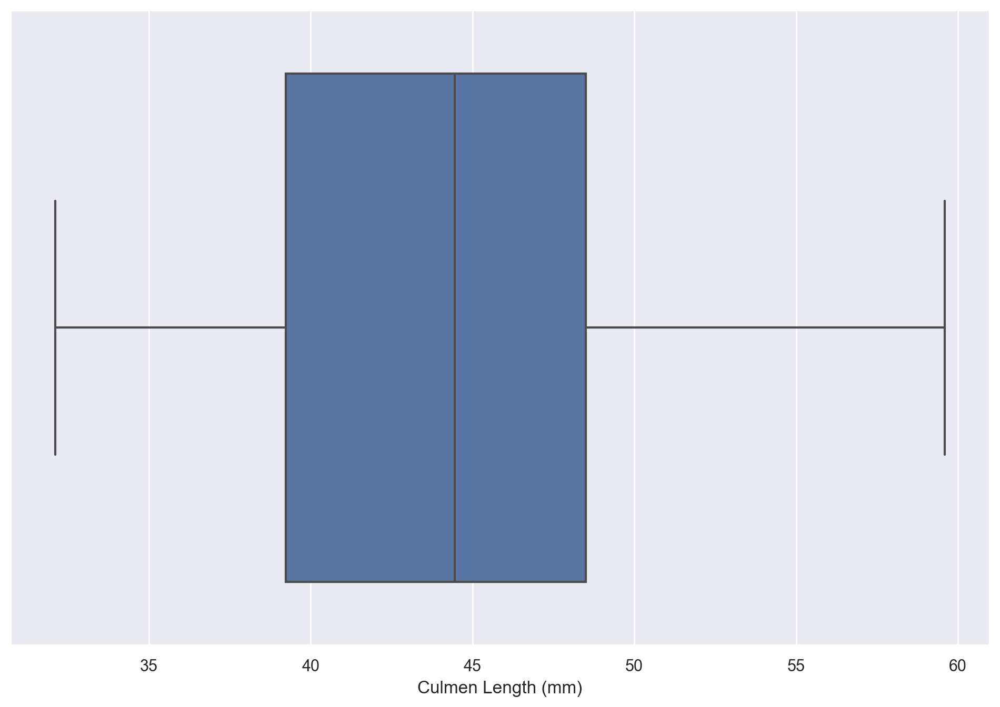

In [15]:
sns.boxplot(x=df['Culmen Length (mm)'])
plt.show() # As you see in Culmen Length (mm) there is no Outlier, similarly We have to check for Culmen Depth,Flipper Length,Body Mass

As you see In Culmen Length there Is no Outlier, similarly We have to Check For Culmen Depth,Flipper Length,Body Mass

Why we Remove Outlier From Dataset ? 

We Remove Outliers From Dataset Because outliers change the Stastical Properties like Mean, Median,Mode of the Dataset so, that why we can either Remove the Outlier OR Replace the Outlier Value by Using Box Plot 

# When We dealing with Missing Value, We Alway keep these 2 Point in Mind

For Continious Data

    a) If Outlier present in the column then Replace the missing value With the Median of that columns
    
    b) If Outlier Not present in the column then simply you can replace the Missing value With the Mean of that columns     

For Discrete Variable

  a) For Discrete Variable Directly you can Replace with the Mode of that column in which Outlier is present



# We Can Use Box Plot for Checking Outliers Present or Not

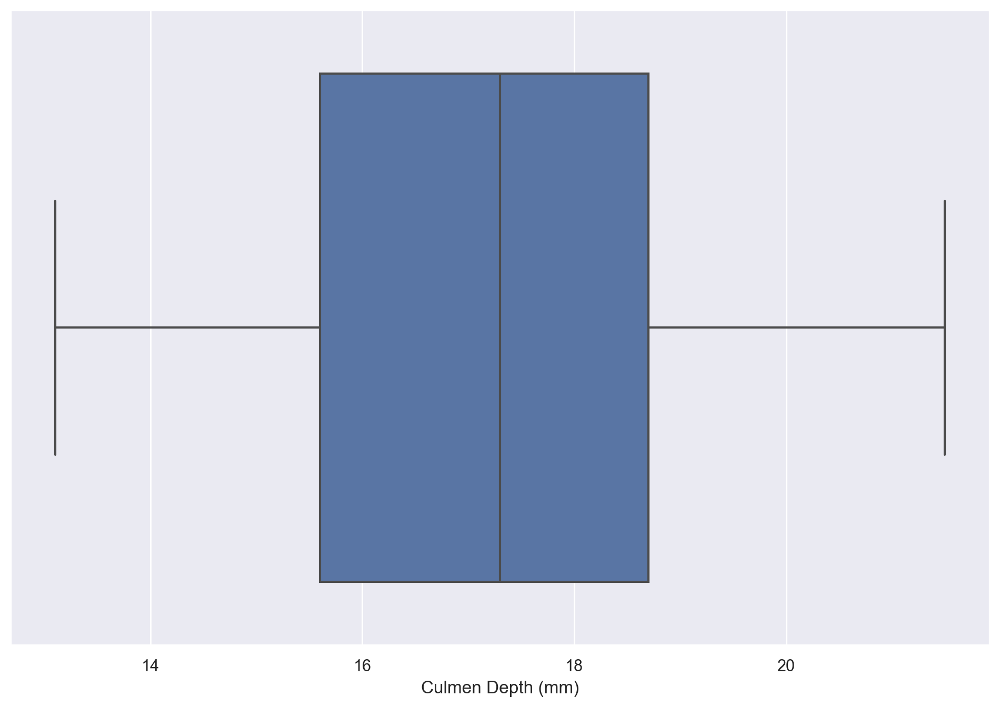

In [16]:
sns.boxplot(x=df['Culmen Depth (mm)'])
plt.show() # As you see there is no outlier present in  Culmen Depth (mm)

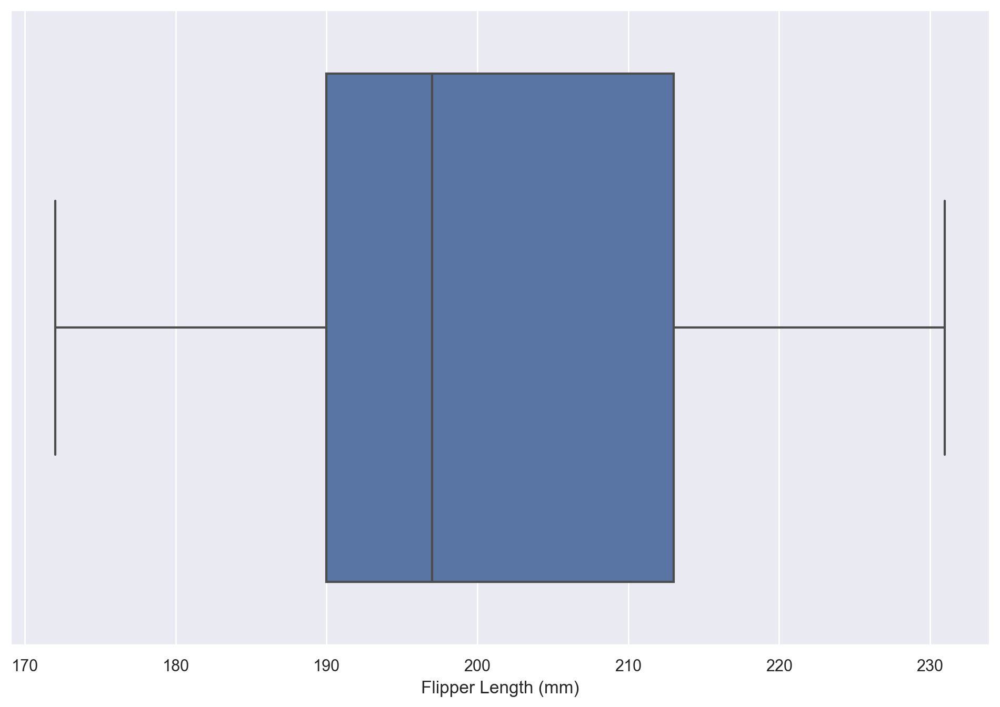

In [17]:
sns.boxplot(x=df['Flipper Length (mm)'])
plt.show() # Also Flipper Length (mm) has no outlier 

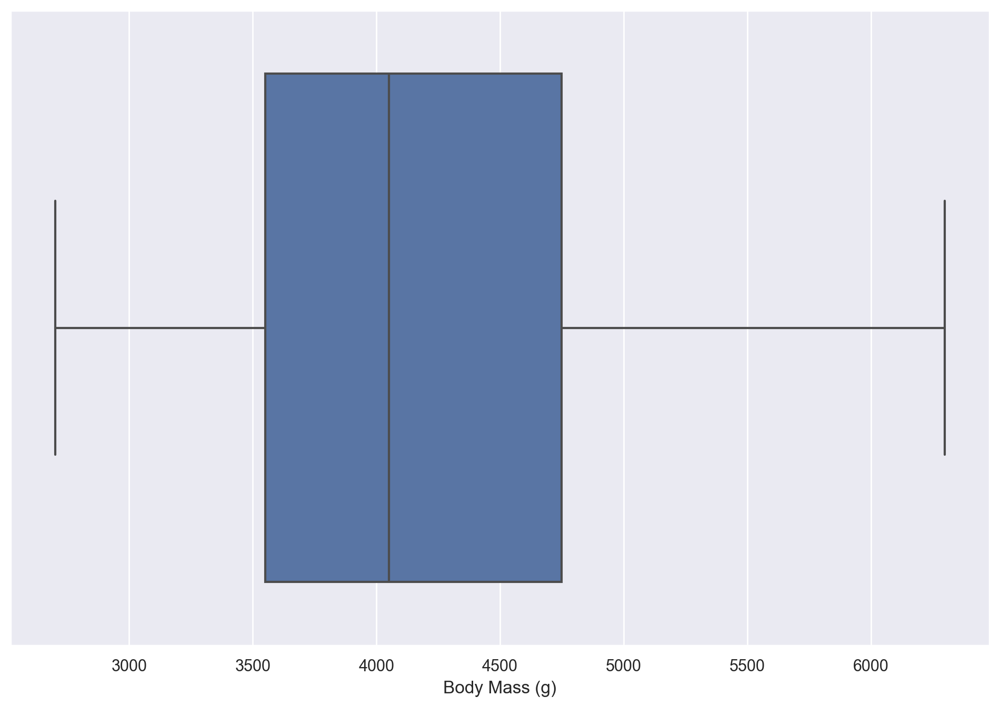

In [18]:
sns.boxplot(x=df['Body Mass (g)'])
plt.show() # Also in Body Mass there is no outlier

## From the above Observation, 

There is no Outliers present in any of the column. so, we are going to finding mean of all the columns and replace the missing value with the mean


In [19]:
df['Culmen Length (mm)'].mean()

43.9219298245614

In [20]:
df['Culmen Depth (mm)'].mean()

17.151169590643278

In [21]:
df['Flipper Length (mm)'].mean()

200.91520467836258

In [22]:
df['Body Mass (g)'].mean()

4201.754385964912

## Filling the Missing Values 

In [23]:
df['Culmen Length (mm)'].fillna(df['Culmen Length (mm)'].mean(),inplace=True)

In [24]:
df['Culmen Depth (mm)'].fillna(df['Culmen Depth (mm)'].mean(),inplace=True)

In [25]:
df['Flipper Length (mm)'].fillna(df['Flipper Length (mm)'].mean(),inplace=True)

In [26]:
df['Body Mass (g)'].fillna(df['Body Mass (g)'].mean(),inplace=True)

In [27]:
df.isnull().sum() # Only one column have null value

studyName              0 
Species                0 
Island                 0 
Clutch Completion      0 
Culmen Length (mm)     0 
Culmen Depth (mm)      0 
Flipper Length (mm)    0 
Body Mass (g)          0 
Sex                    10
dtype: int64

In [28]:
df['Sex'].unique()

array(['MALE', 'FEMALE', nan, '.'], dtype=object)

# if Discreat Variable have a missing value then replace with mode

In [29]:
df['Sex'].mode()

0    MALE
Name: Sex, dtype: object

In [30]:
df['Sex'].fillna(df['Sex'].mode()[0],inplace=True)

In [31]:
df['Sex'].unique()

array(['MALE', 'FEMALE', '.'], dtype=object)

In [32]:
df[df['Sex']=='.']

,studyName,Species,Island,Clutch Completion,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Sex
336,PAL0910,Gentoo penguin (Pygoscelis papua),Biscoe,Yes,44.5,15.7,217.0,4875.0,.


In [33]:
df.at[336,'Sex']='MALE'

In [34]:
df['Sex'].unique()

array(['MALE', 'FEMALE'], dtype=object)

In [35]:
df.isnull().sum()

studyName              0
Species                0
Island                 0
Clutch Completion      0
Culmen Length (mm)     0
Culmen Depth (mm)      0
Flipper Length (mm)    0
Body Mass (g)          0
Sex                    0
dtype: int64

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   studyName            344 non-null    object 
 1   Species              344 non-null    object 
 2   Island               344 non-null    object 
 3   Clutch Completion    344 non-null    object 
 4   Culmen Length (mm)   344 non-null    float64
 5   Culmen Depth (mm)    344 non-null    float64
 6   Flipper Length (mm)  344 non-null    float64
 7   Body Mass (g)        344 non-null    float64
 8   Sex                  344 non-null    object 
dtypes: float64(4), object(5)
memory usage: 24.3+ KB


# Histogram For All the Numerical Column like :

Culmen Length (mm), Culmen Depth (mm), Flipper Length (mm), Body Mass (g) 

Histogram Is used check the Distribution of Numerical value Or Data Point In Dataset Or Particular Column


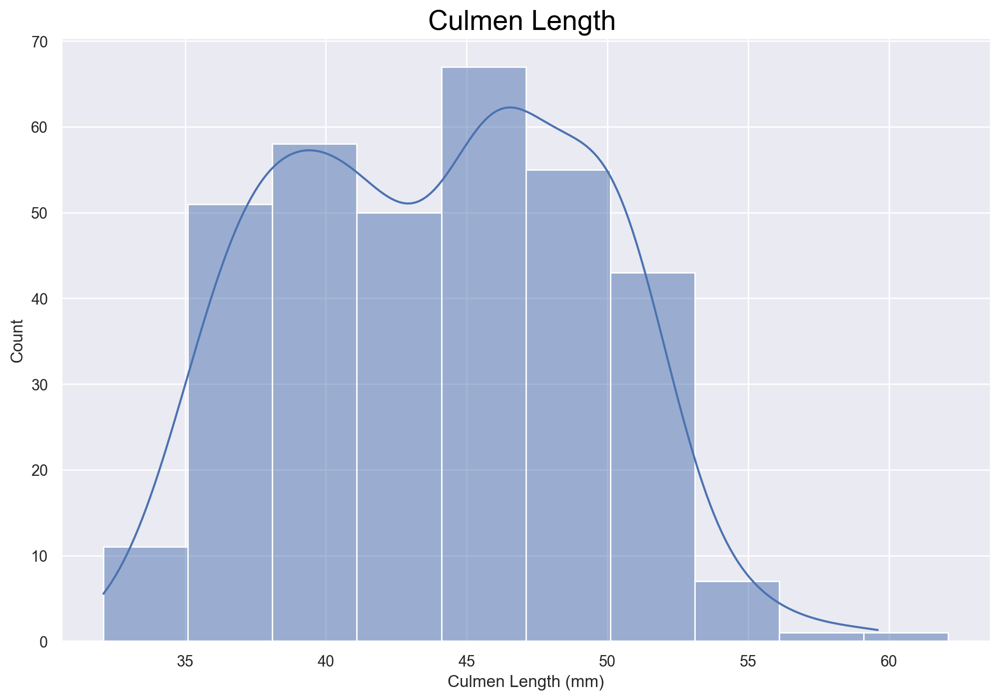

In [37]:
sns.histplot(x=df['Culmen Length (mm)'],data=df,binwidth=3,kde=True)
plt.title('Culmen Length ',size=20,color='black')
plt.show()

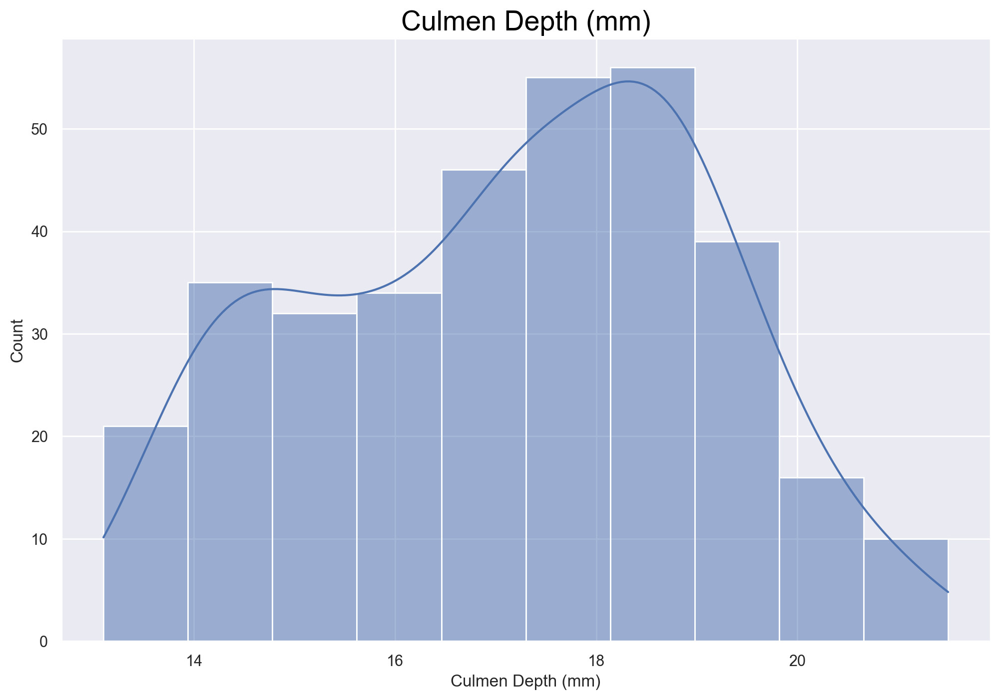

In [38]:
sns.histplot(x=df['Culmen Depth (mm)'],data=df,kde=True)
plt.title('Culmen Depth (mm)',size=20,color='black')
plt.show()

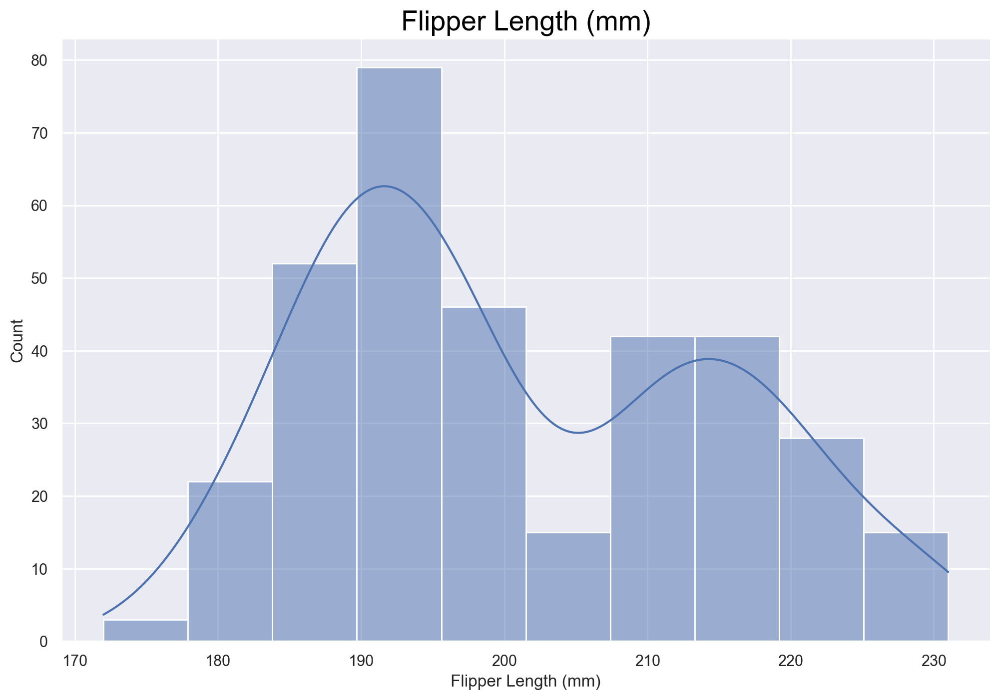

In [39]:
sns.histplot(x=df['Flipper Length (mm)'],data=df,kde=True)
plt.title('Flipper Length (mm)',size=20,color='black')
plt.show()

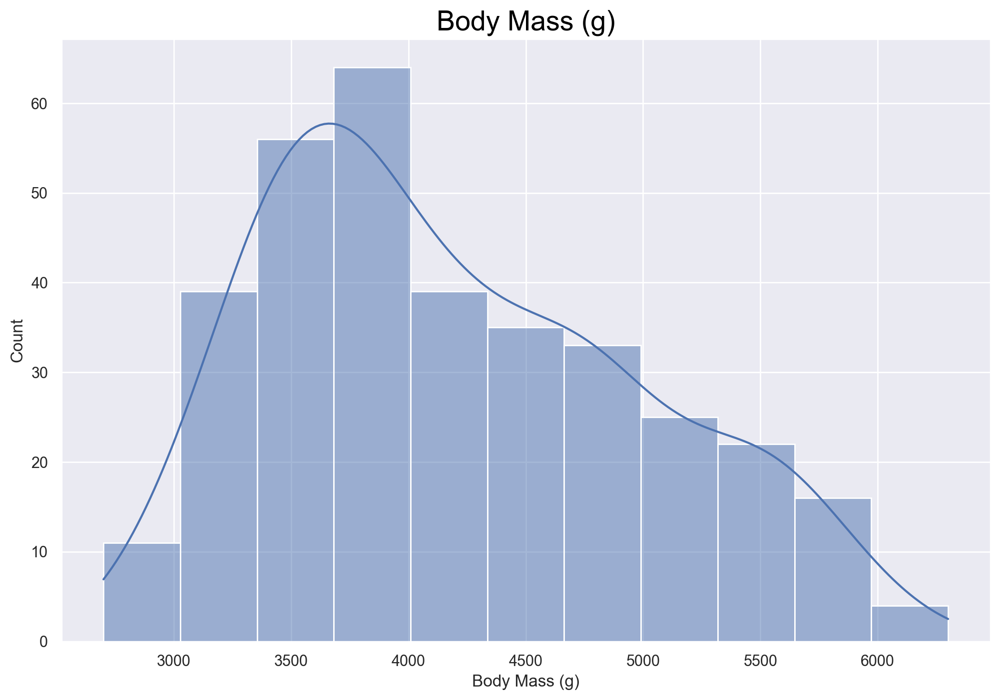

In [40]:
sns.histplot(x=df['Body Mass (g)'],data=df,kde=True)
plt.title('Body Mass (g)',size=20,color='black')
plt.show()

# Pie Chart

In [41]:
df['studyName'].unique()

array(['PAL0708', 'PAL0809', 'PAL0910'], dtype=object)

In [42]:
cat1=df['studyName'].value_counts()
cat1

PAL0910    120
PAL0809    114
PAL0708    110
Name: studyName, dtype: int64

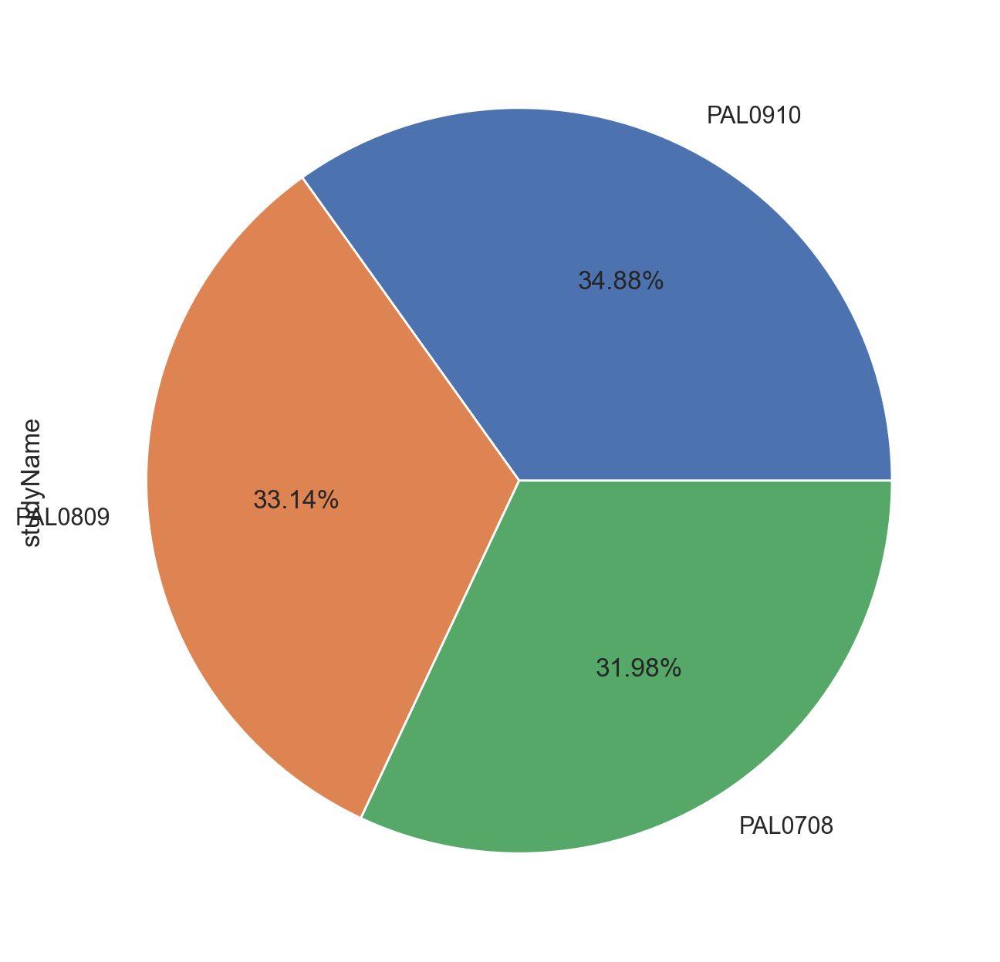

In [43]:
cat1.plot(kind='pie',autopct='%1.2f%%')
plt.show()

In [44]:
df['Species'].unique()

array(['Adelie Penguin (Pygoscelis adeliae)',
       'Chinstrap penguin (Pygoscelis antarctica)',
       'Gentoo penguin (Pygoscelis papua)'], dtype=object)

In [45]:
cat2=df['Species'].value_counts()
cat2

Adelie Penguin (Pygoscelis adeliae)          152
Gentoo penguin (Pygoscelis papua)            124
Chinstrap penguin (Pygoscelis antarctica)    68 
Name: Species, dtype: int64

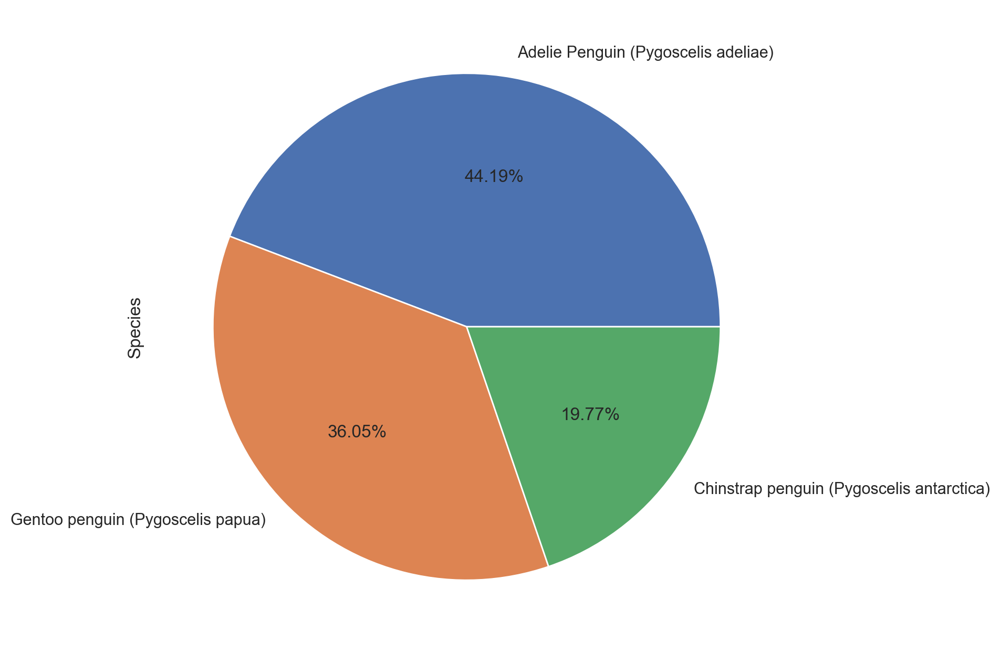

In [51]:
cat2.plot(kind='pie',autopct='%1.2f%%')
plt.show()

In [78]:
df['Island'].unique()

array(['Torgersen', 'Biscoe', 'Dream'], dtype=object)

In [79]:
cat3=df['Island'].value_counts()
cat3

Biscoe       168
Dream        124
Torgersen    52 
Name: Island, dtype: int64

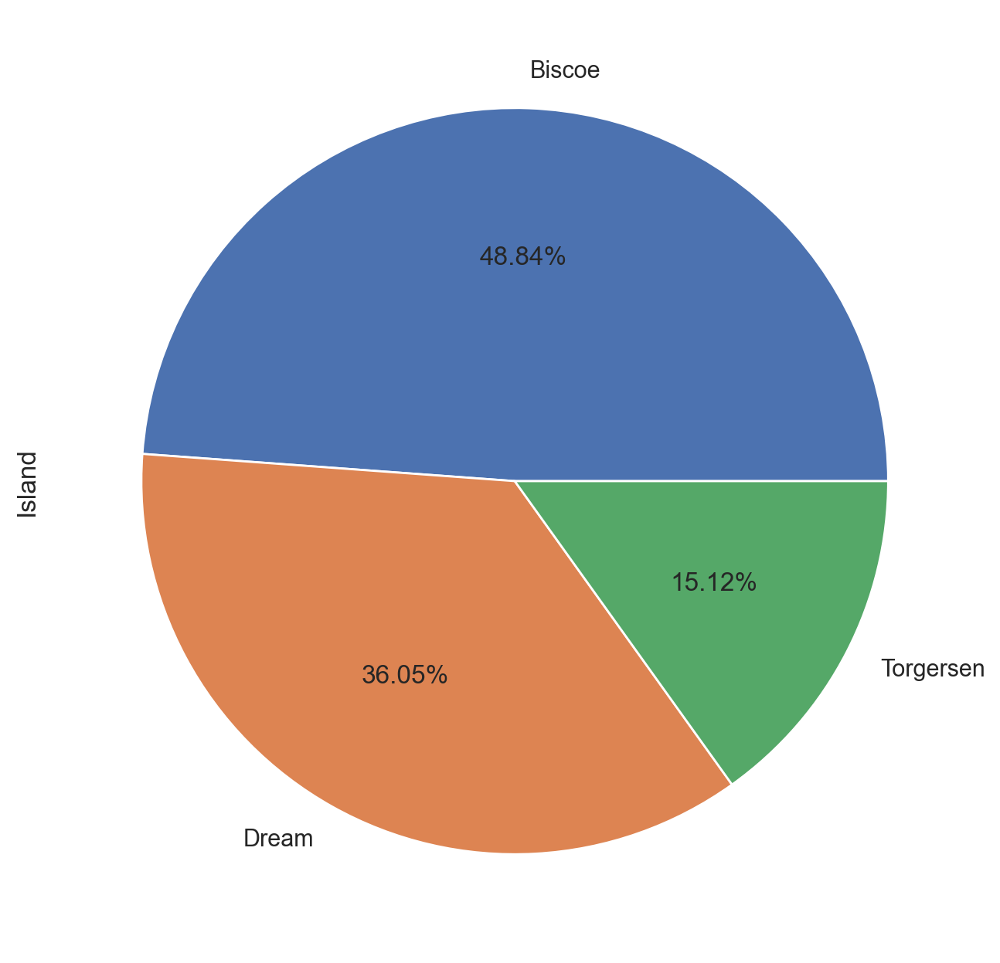

In [80]:
cat3.plot(kind='pie',autopct='%1.2f%%')
plt.show()

# Count Plot

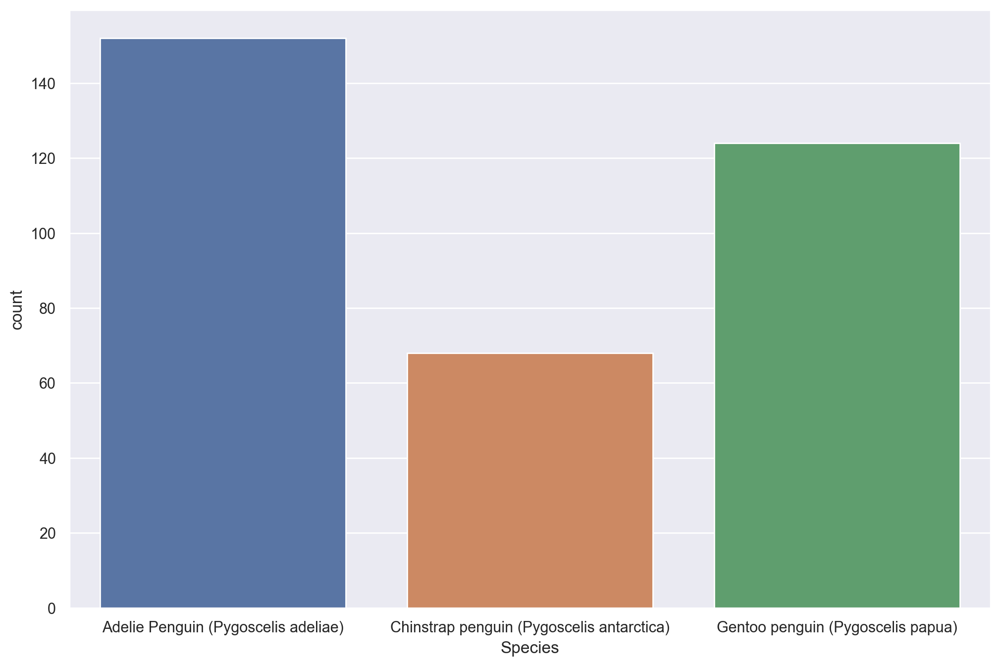

In [50]:
sns.countplot(x=df['Species'],data=df)
plt.show()

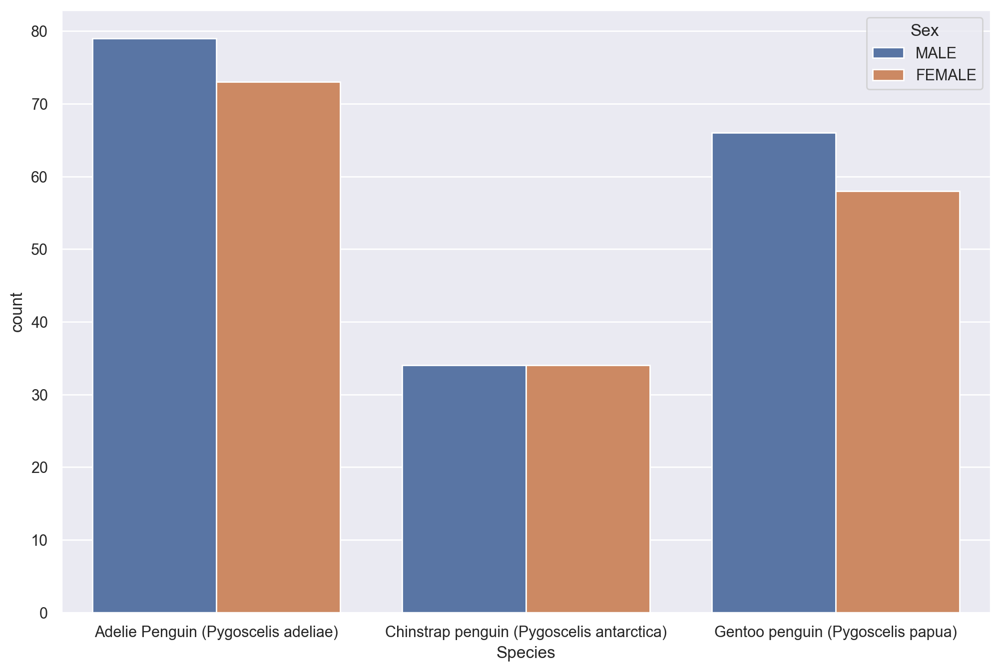

In [59]:
sns.countplot(x=df['Species'],data=df,hue='Sex')
plt.show()

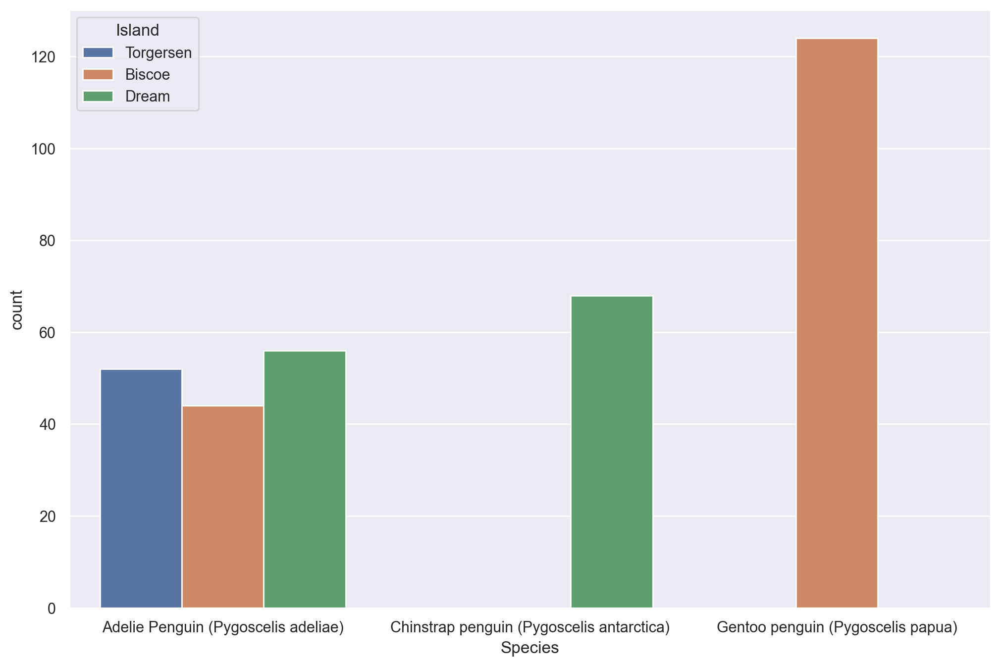

In [63]:
sns.countplot(x=df['Species'],data=df,hue='Island')
plt.show()

### From the above Count Plot we can say that the Adelie Penguin find in all the three Island. and Chinstrap Penguin is find only on Dream Island and Gentoo Penguin is find only the Biscoe Island

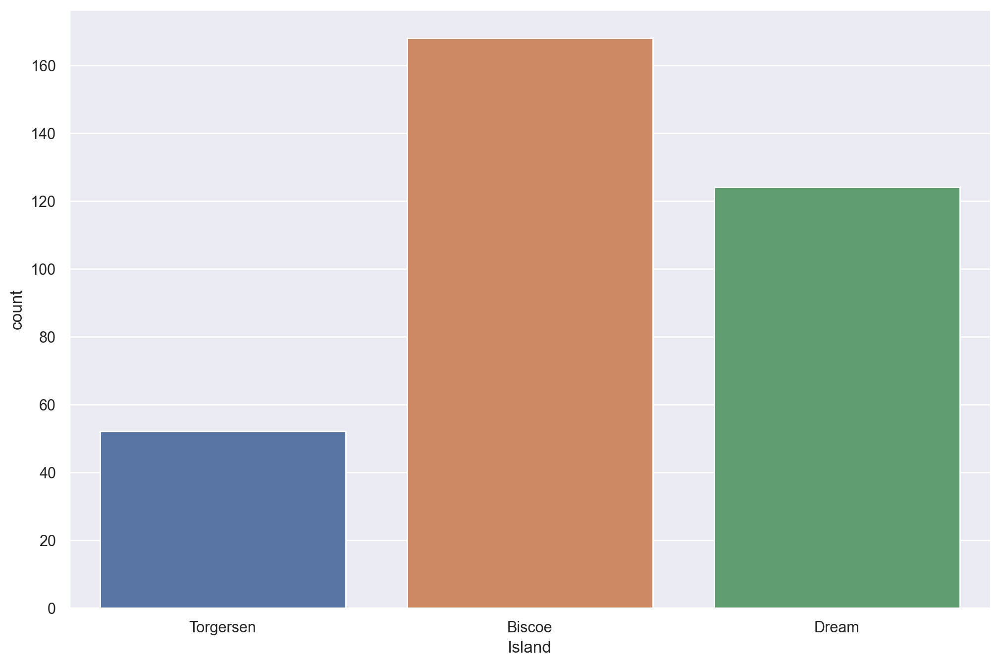

In [85]:
sns.countplot(x=df['Island'],data=df)
plt.show()

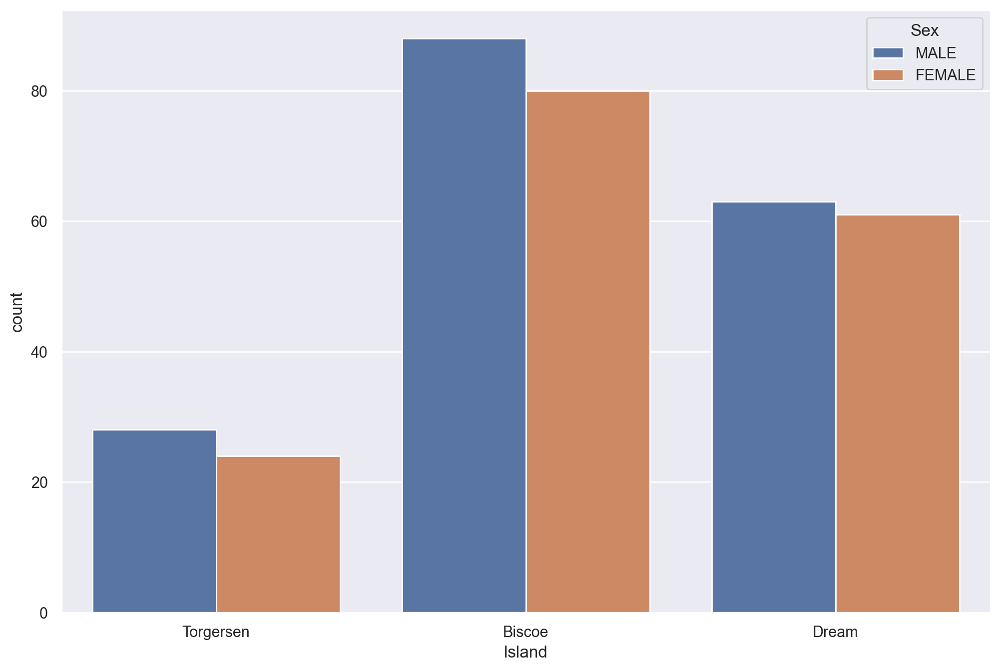

In [86]:
sns.countplot(x=df['Island'],data=df,hue='Sex')
plt.show()

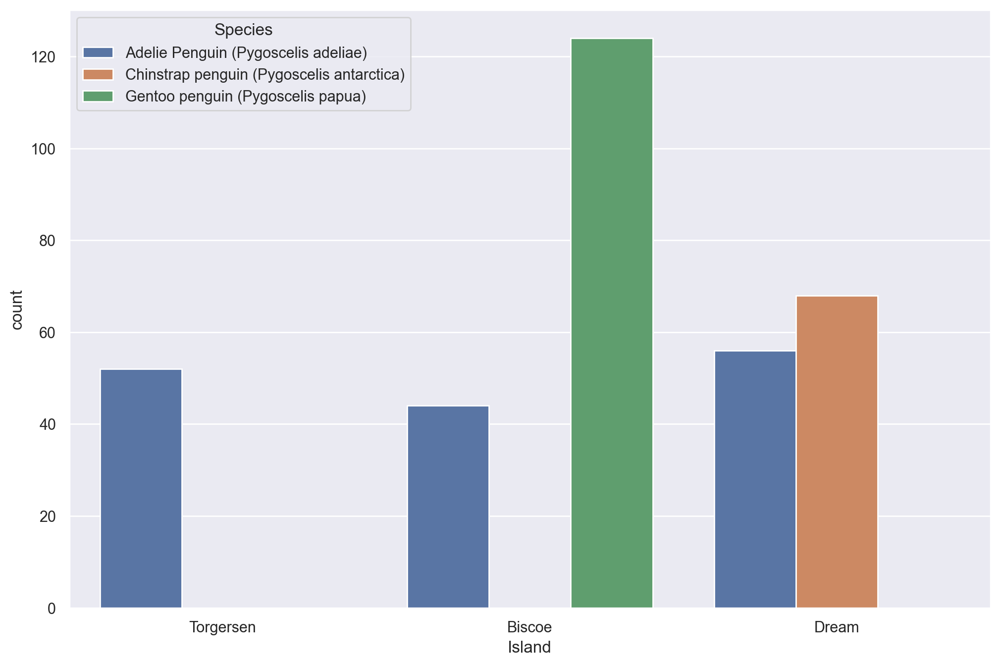

In [87]:
sns.countplot(x=df['Island'],data=df,hue='Species')
plt.show()

# Scatter Plot

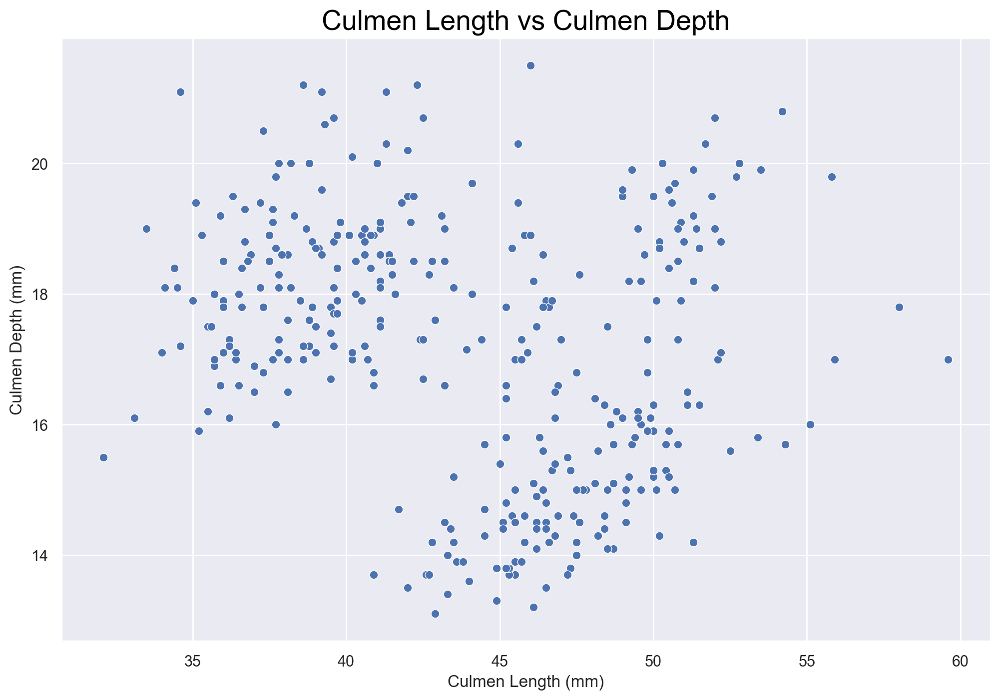

In [99]:
sns.scatterplot(x=df['Culmen Length (mm)'],y=df['Culmen Depth (mm)'],data=df)
plt.title('Culmen Length vs Culmen Depth',size=20,color='black')
plt.show()

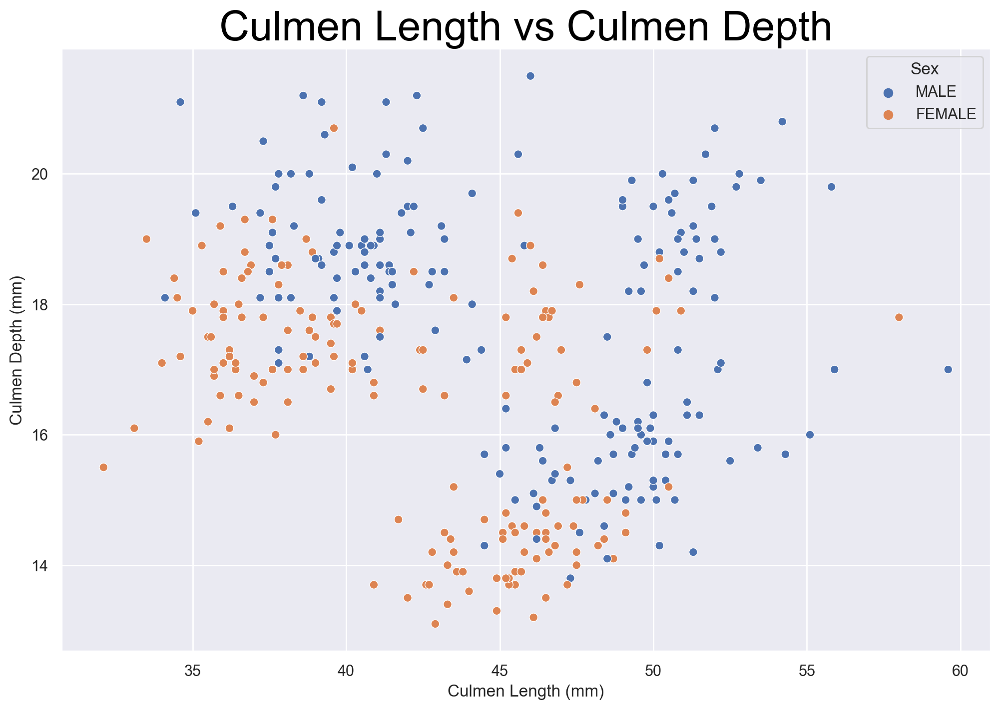

In [100]:
sns.scatterplot(x=df['Culmen Length (mm)'],y=df['Culmen Depth (mm)'],data=df,hue='Sex')
plt.title('Culmen Length vs Culmen Depth',size=30,color='black')
plt.show()

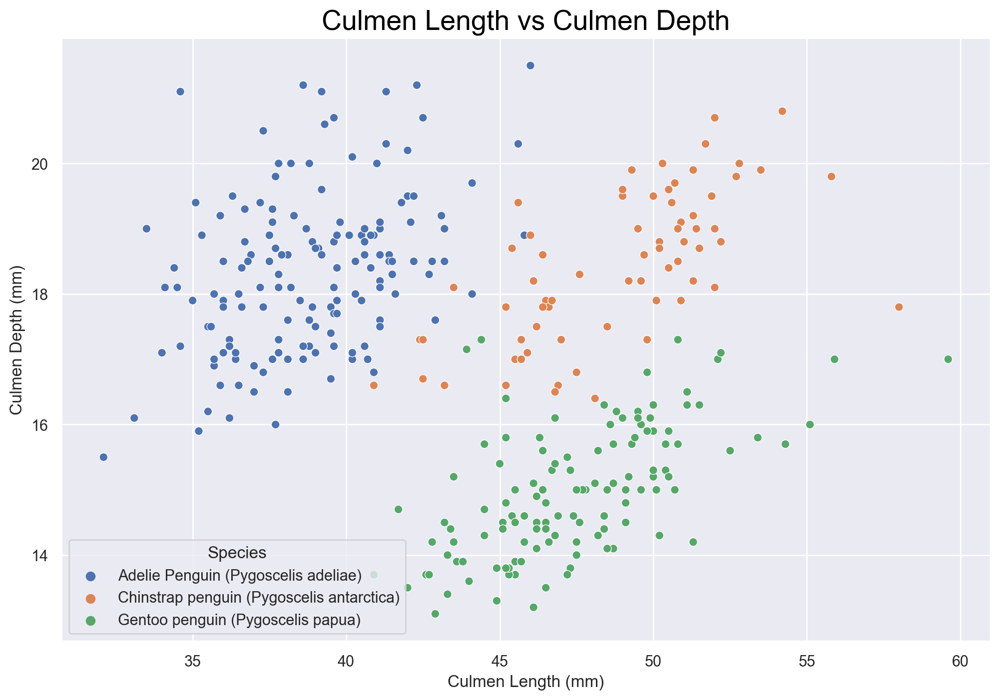

In [102]:
sns.scatterplot(x=df['Culmen Length (mm)'],y=df['Culmen Depth (mm)'],data=df,hue='Species')
plt.title('Culmen Length vs Culmen Depth',size=20,color='black')
plt.show()

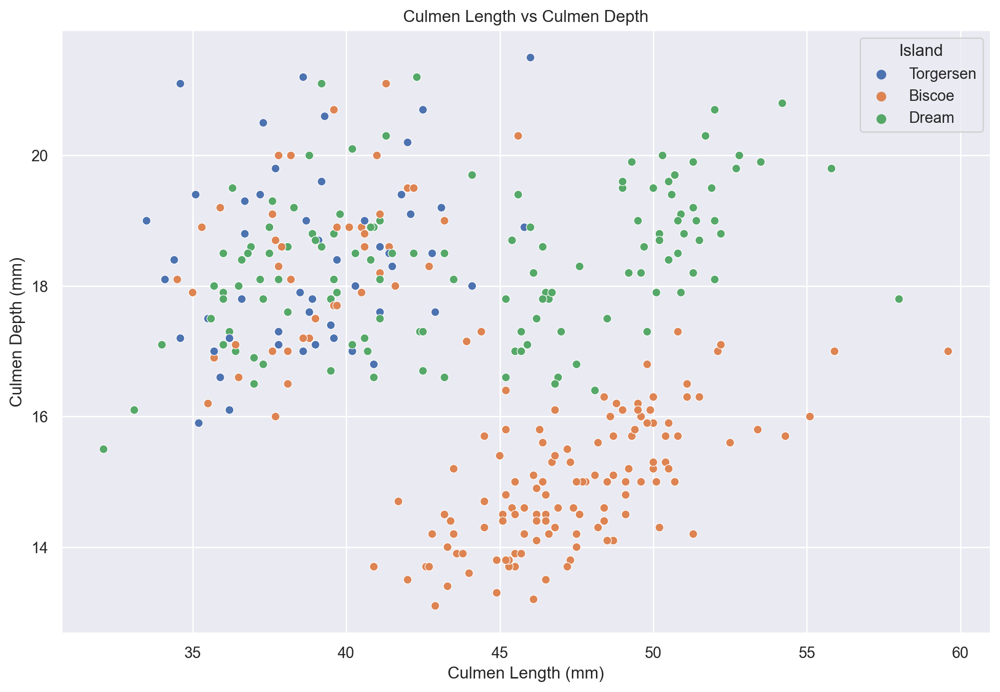

In [105]:
sns.scatterplot(x=df['Culmen Length (mm)'],y=df['Culmen Depth (mm)'],data=df,hue='Island')
plt.title('Culmen Length vs Culmen Depth')
plt.show()

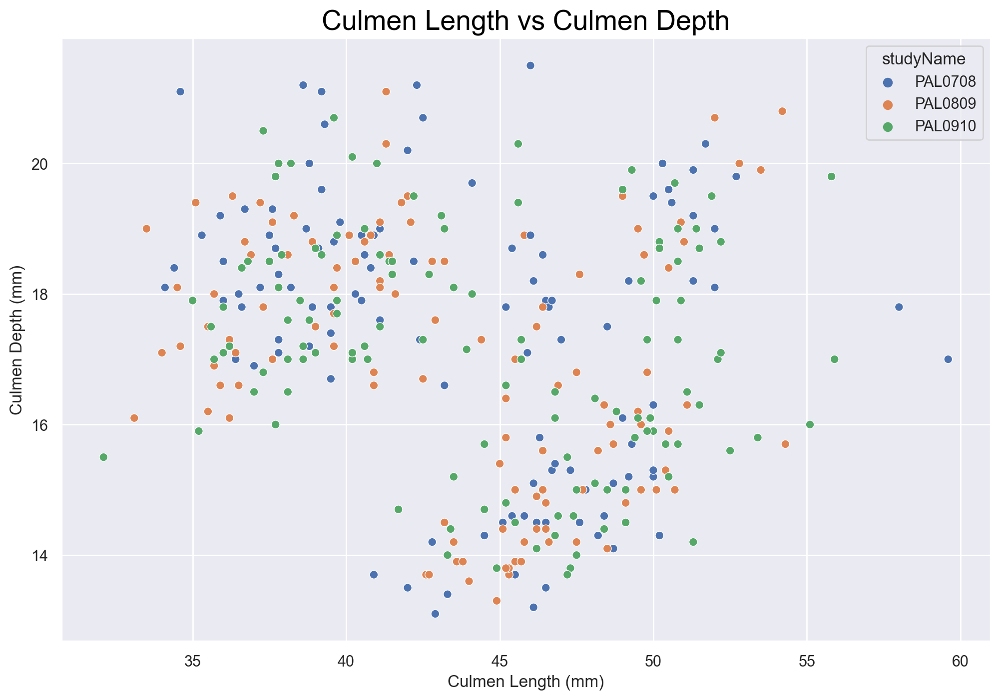

In [108]:
sns.scatterplot(x=df['Culmen Length (mm)'],y=df['Culmen Depth (mm)'],data=df,hue='studyName')
plt.title('Culmen Length vs Culmen Depth',size=20,color='black')
plt.show()

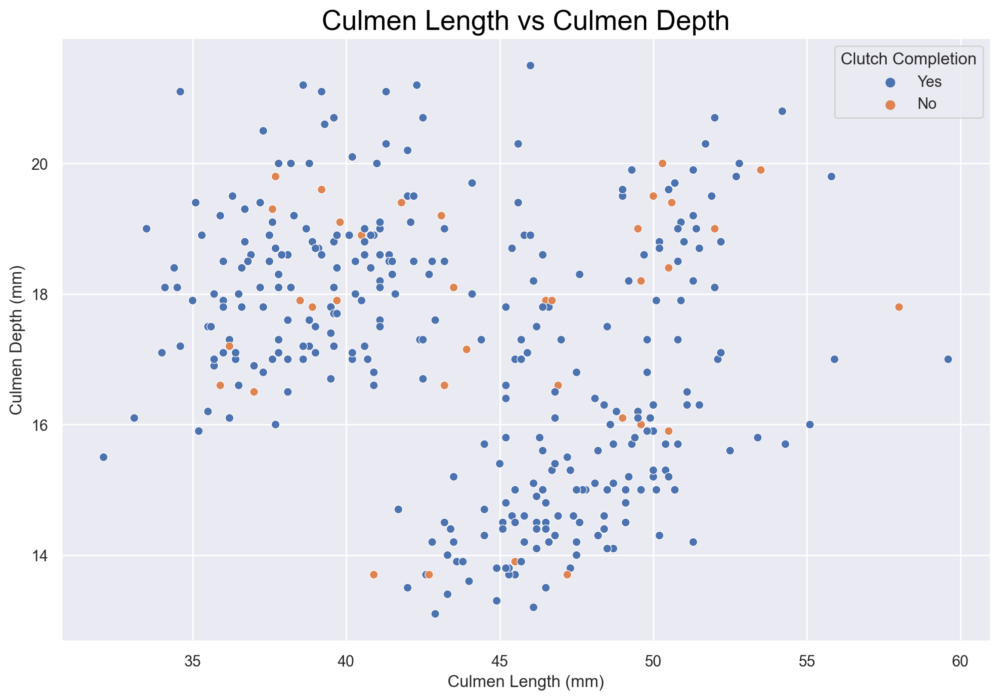

In [110]:
sns.scatterplot(x=df['Culmen Length (mm)'],y=df['Culmen Depth (mm)'],data=df,hue='Clutch Completion')
plt.title('Culmen Length vs Culmen Depth',size=20,color = 'black')
plt.show()

# Hist Plot

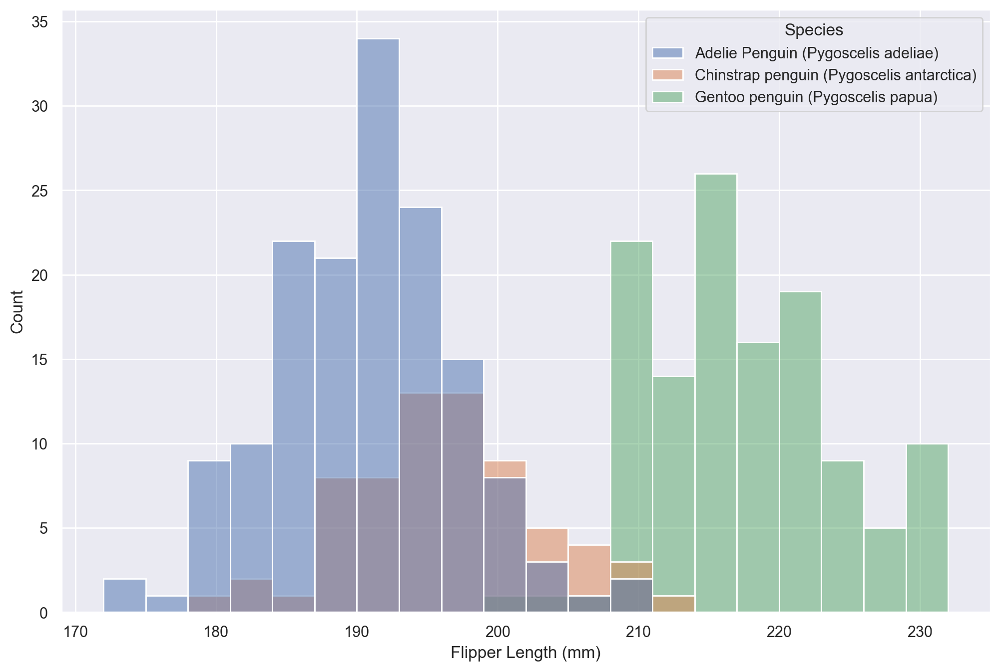

In [118]:
sns.histplot(x=df['Flipper Length (mm)'],data=df,hue='Species',binwidth=3)
plt.show()

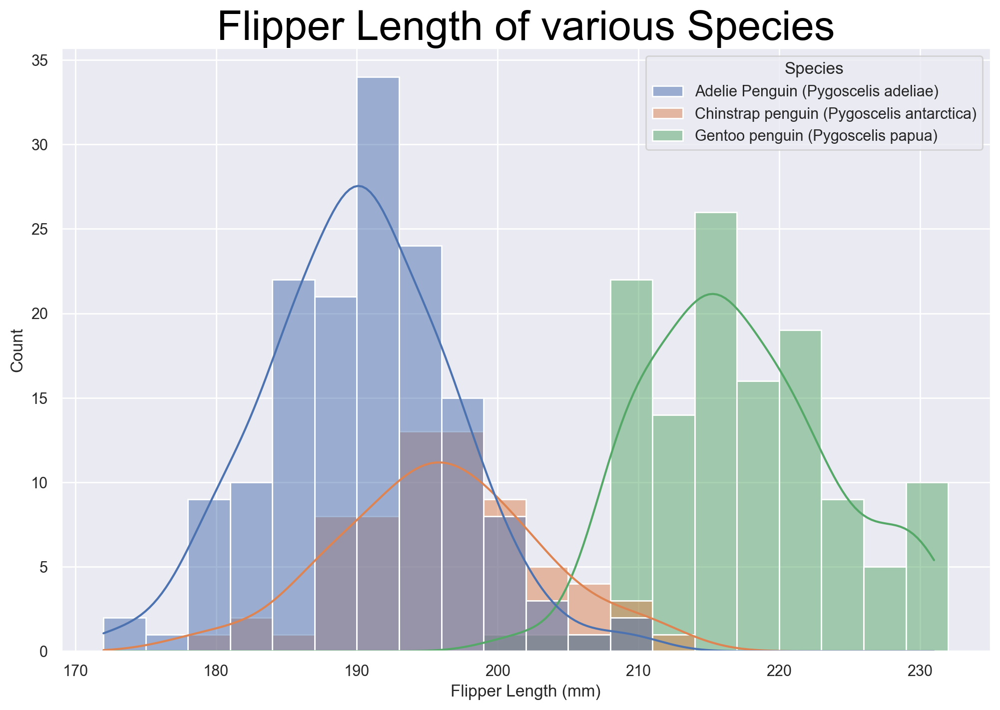

In [120]:
sns.histplot(x=df['Flipper Length (mm)'],data=df,hue='Species',binwidth=3 ,kde=True)
plt.title('Flipper Length of various Species',size=30,color='black')
plt.show()

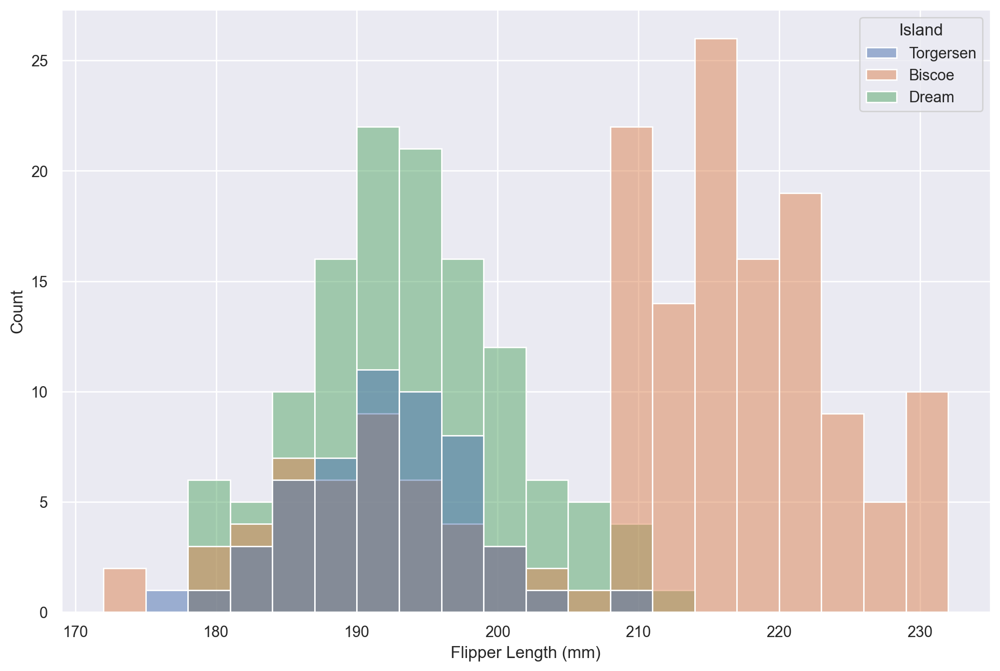

In [121]:
sns.histplot(x=df['Flipper Length (mm)'],data=df,hue='Island',binwidth=3)
plt.show()

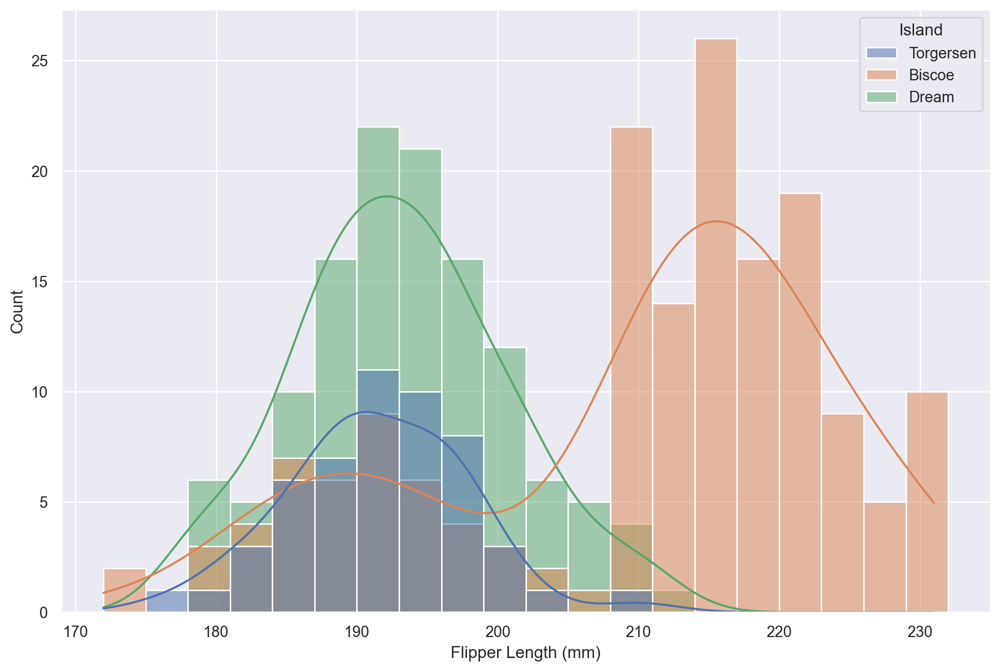

In [122]:
sns.histplot(x=df['Flipper Length (mm)'],data=df,hue='Island',binwidth=3,kde=True)
plt.show()

# Box Plot

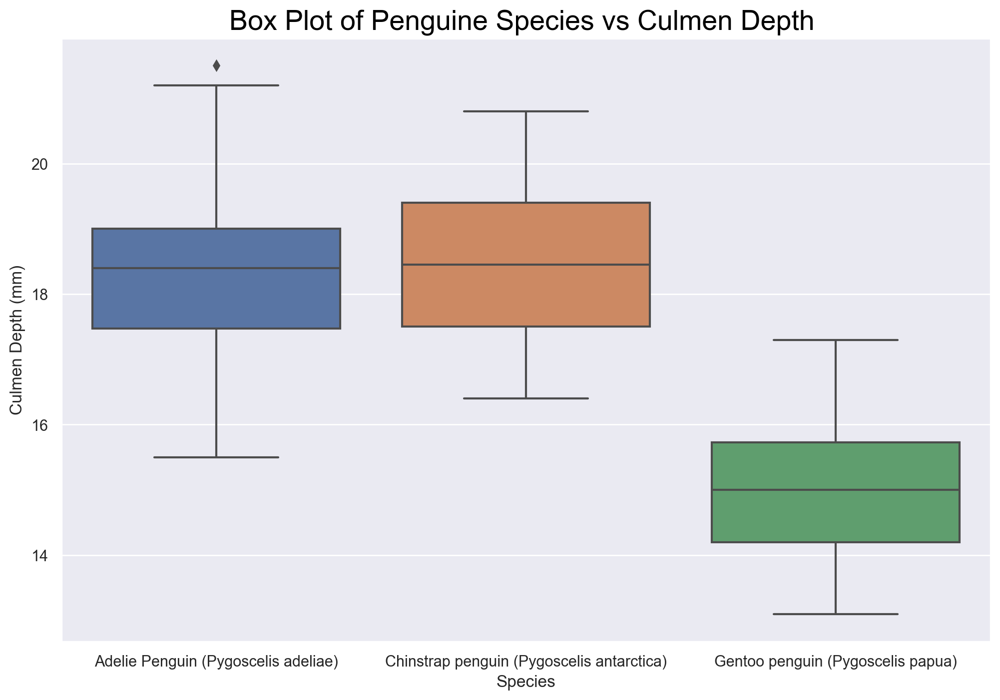

In [148]:
sns.boxplot(x=df['Species'],y=df['Culmen Depth (mm)'],data=df)
plt.title('Box Plot of Penguine Species vs Culmen Depth ',size=20,color='black')
plt.show()

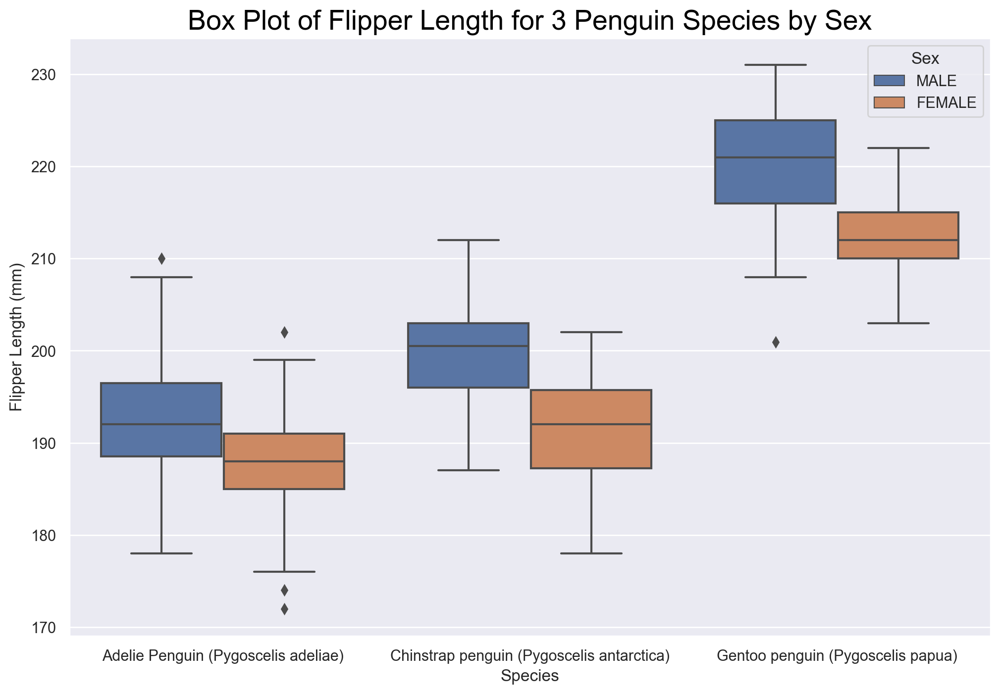

In [147]:
sns.boxplot(x=df['Species'],y=df['Flipper Length (mm)'],data=df,hue='Sex')
plt.title('Box Plot of Flipper Length for 3 Penguin Species by Sex',size=20,color='black')
plt.show()

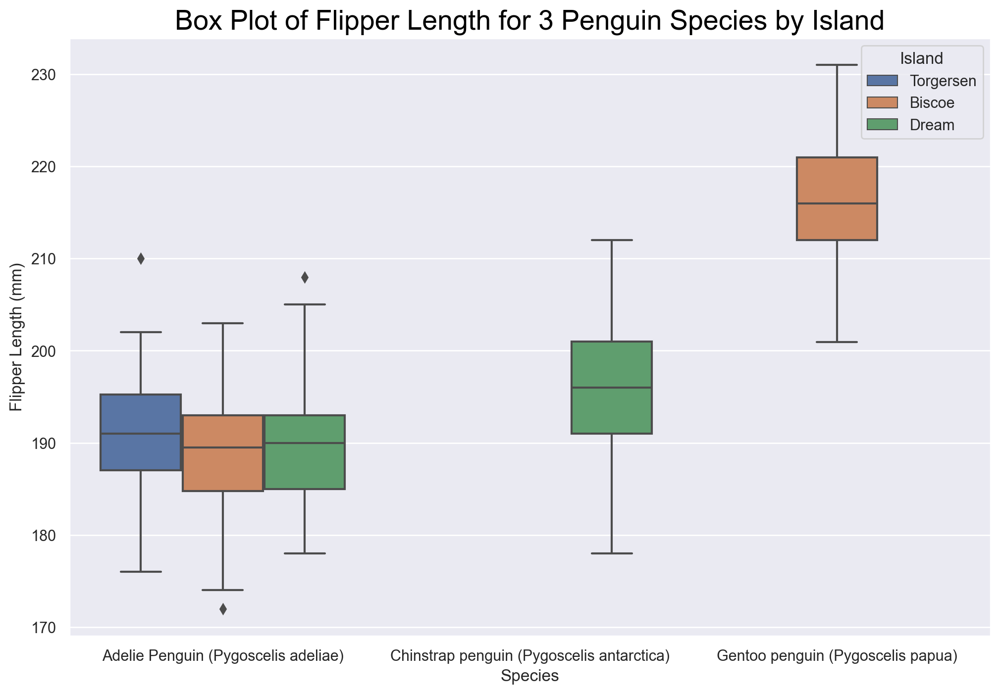

In [146]:
sns.boxplot(x=df['Species'],y=df['Flipper Length (mm)'],data=df,hue='Island')
plt.title('Box Plot of Flipper Length for 3 Penguin Species by Island',size=20,color='black')
plt.show()

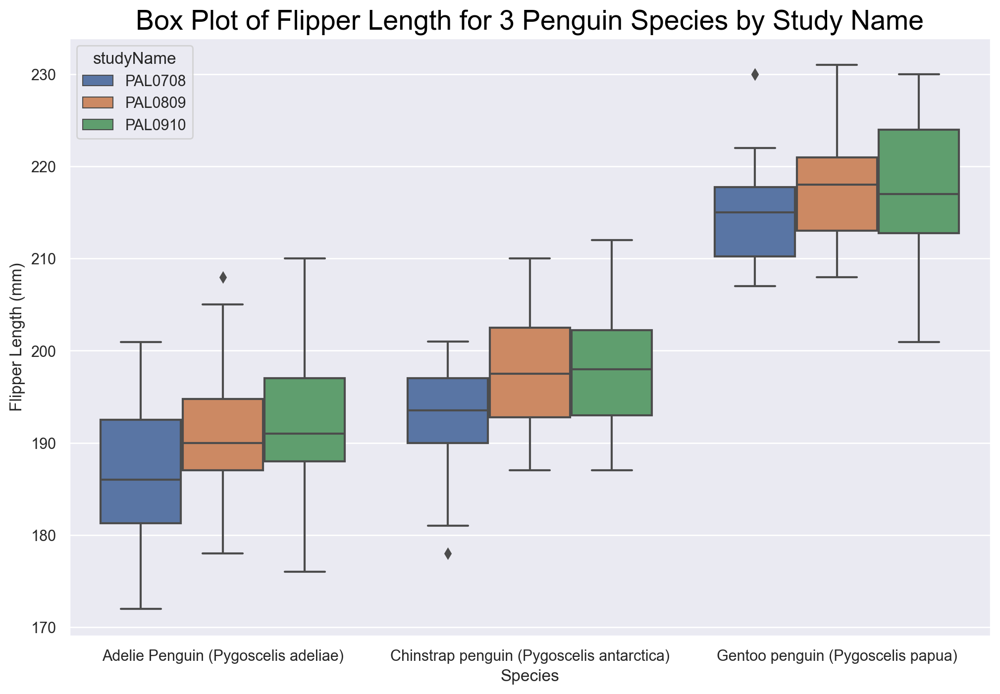

In [145]:
sns.boxplot(x=df['Species'],y=df['Flipper Length (mm)'],data=df,hue='studyName')
plt.title('Box Plot of Flipper Length for 3 Penguin Species by Study Name',size=20,color='black')
plt.show()

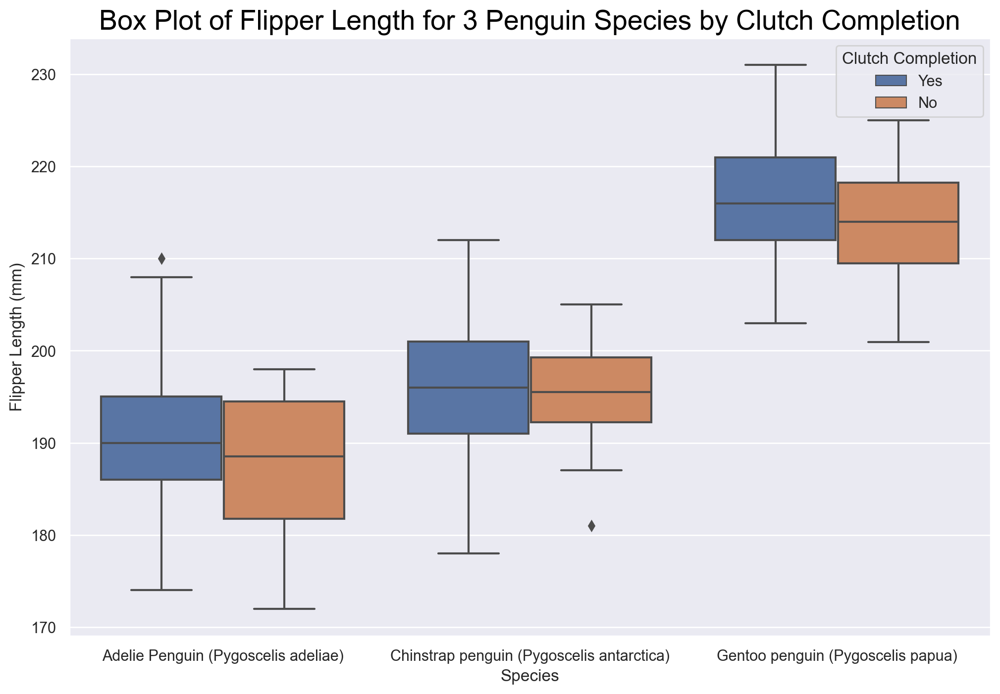

In [144]:
sns.boxplot(x=df['Species'],y=df['Flipper Length (mm)'],data=df,hue='Clutch Completion')
plt.title('Box Plot of Flipper Length for 3 Penguin Species by Clutch Completion',size=20,color='black')
plt.show()

# Violin Plot                         

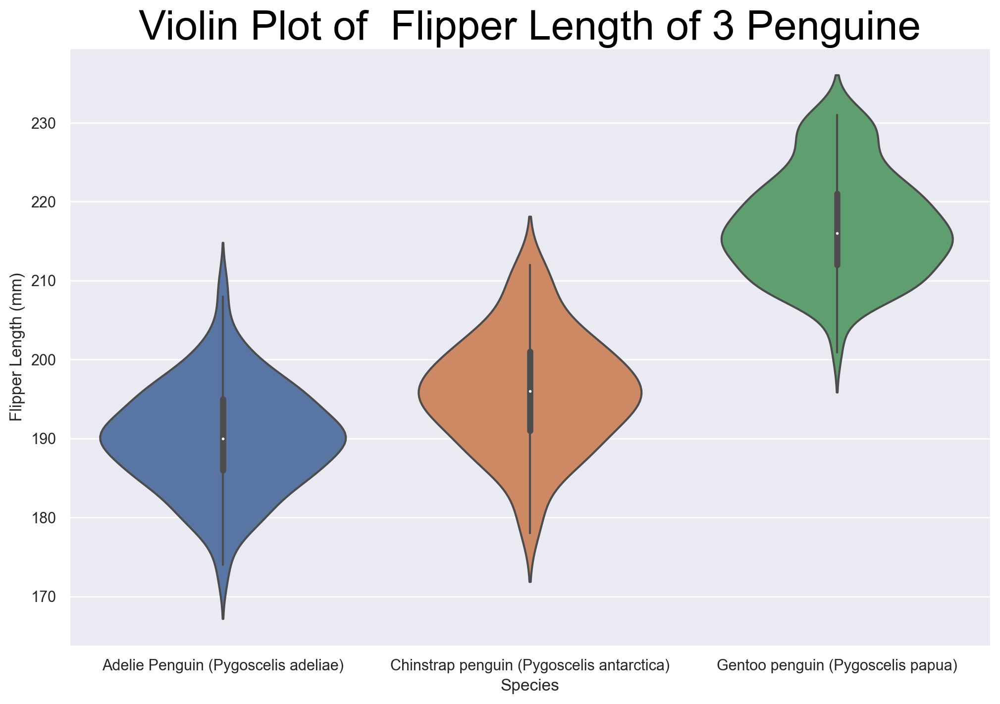

In [133]:
sns.violinplot(x=df['Species'],y=df['Flipper Length (mm)'],data=df)
plt.title('Violin Plot of  Flipper Length of 3 Penguine',size=30, color = 'black')
plt.show()

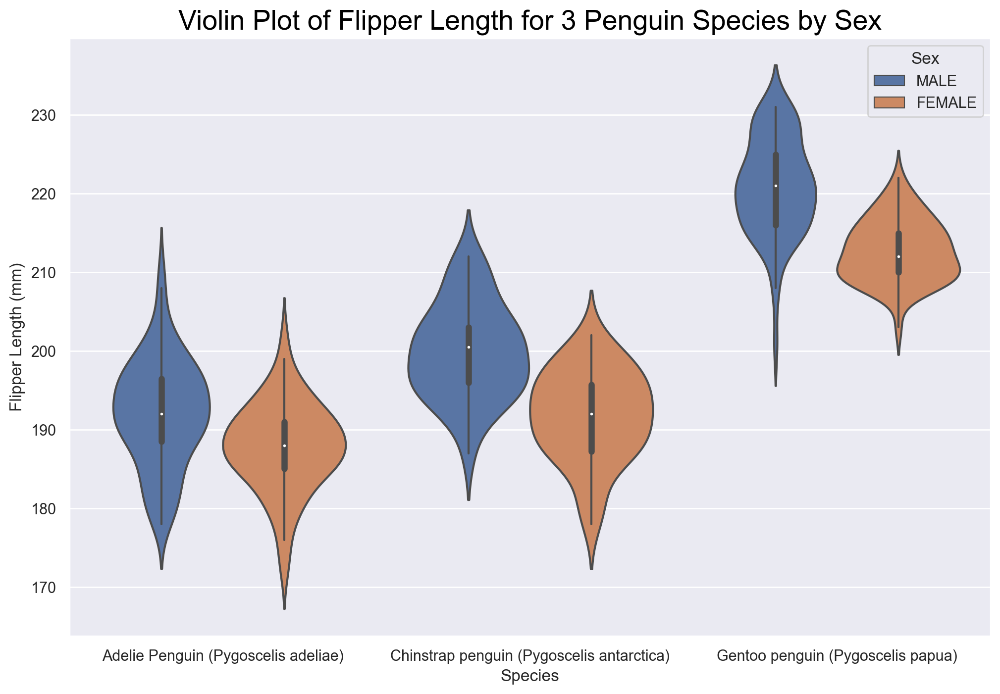

In [143]:
sns.violinplot(x=df['Species'],y=df['Flipper Length (mm)'],data=df,hue='Sex')
plt.title('Violin Plot of Flipper Length for 3 Penguin Species by Sex',size=20,color='black')
plt.show()

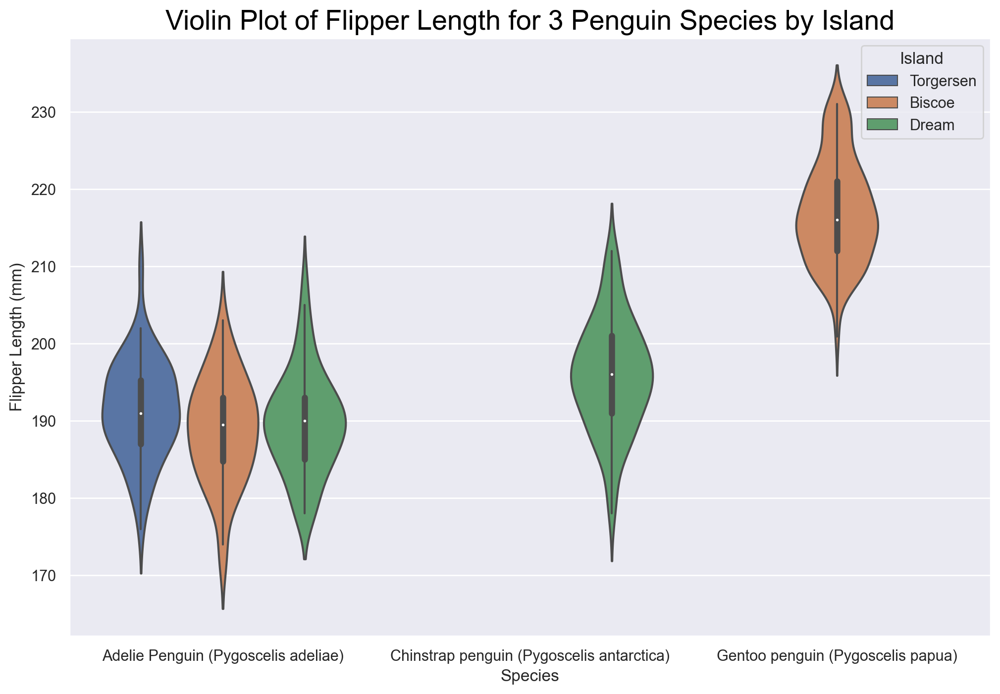

In [142]:
sns.violinplot(x=df['Species'],y=df['Flipper Length (mm)'],data=df,hue='Island')
plt.title('Violin Plot of Flipper Length for 3 Penguin Species by Island',size=20,color='black')
plt.show()

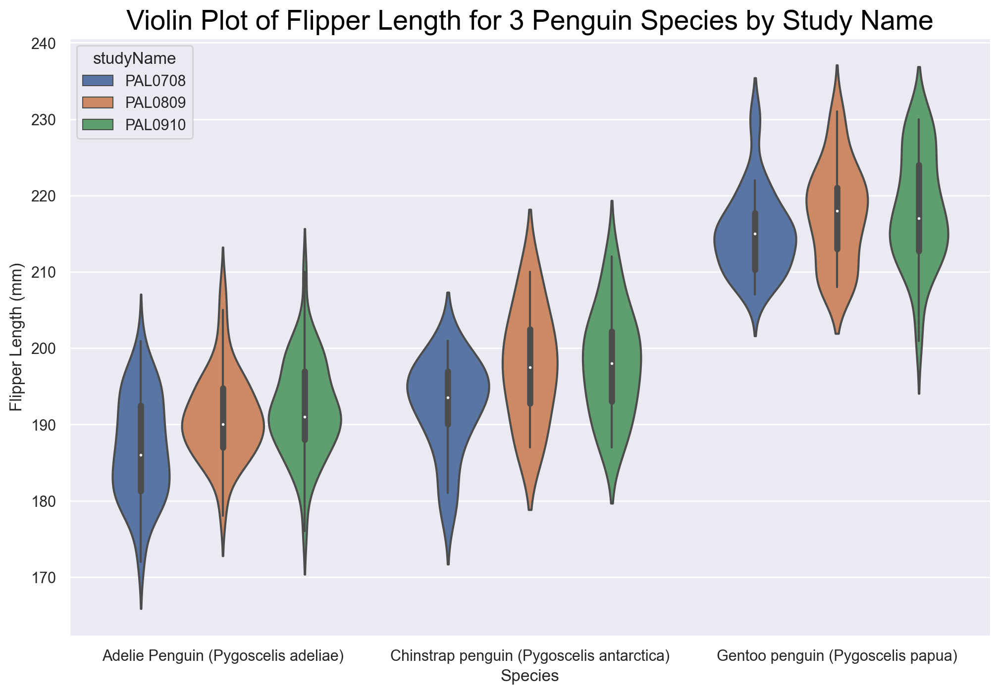

In [141]:
sns.violinplot(x=df['Species'],y=df['Flipper Length (mm)'],data=df,hue='studyName')
plt.title('Violin Plot of Flipper Length for 3 Penguin Species by Study Name',size=20,color='black')
plt.show()

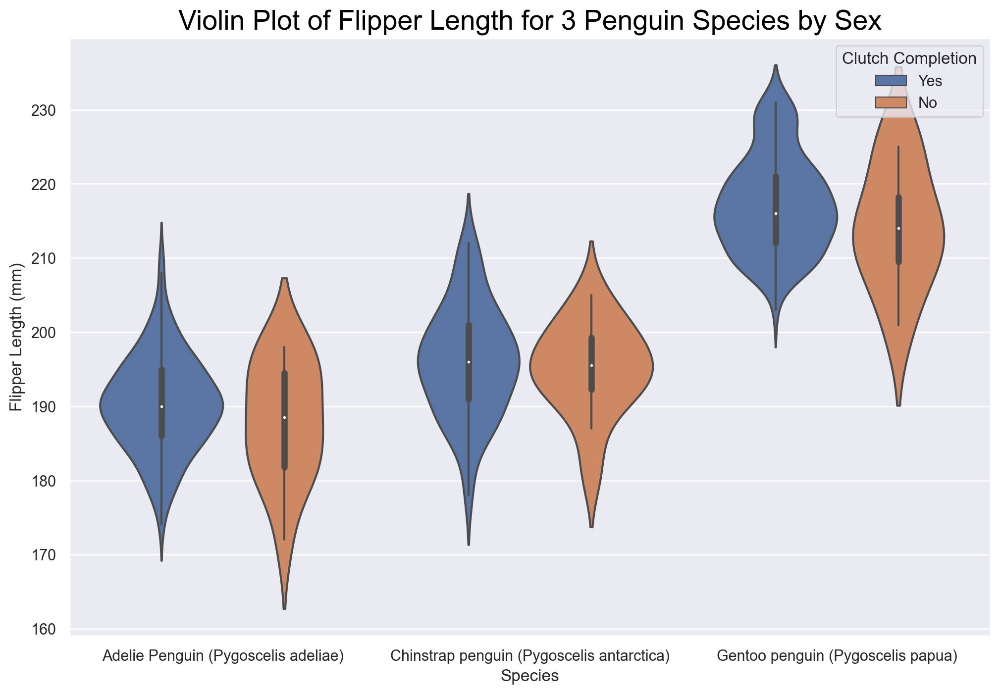

In [140]:
sns.violinplot(x=df['Species'],y=df['Flipper Length (mm)'],data=df,hue='Clutch Completion')
plt.title('Violin Plot of Flipper Length for 3 Penguin Species by Sex',size=20,color='black')
plt.show()

# Facet Grid 

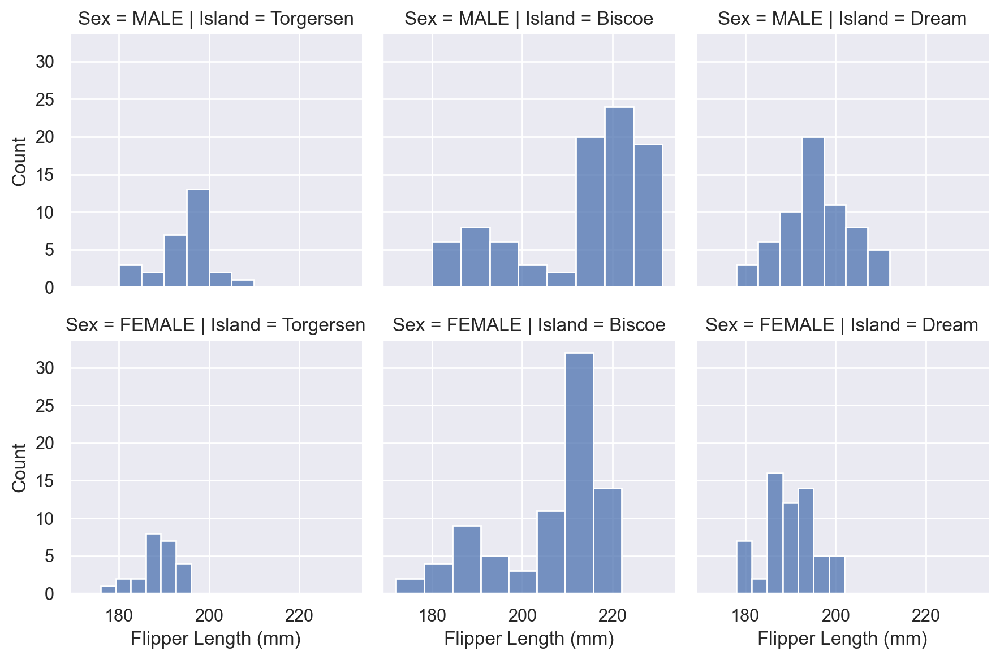

In [151]:
sns.FacetGrid(data=df,row='Sex',col='Island').map(sns.histplot,'Flipper Length (mm)')
plt.show()

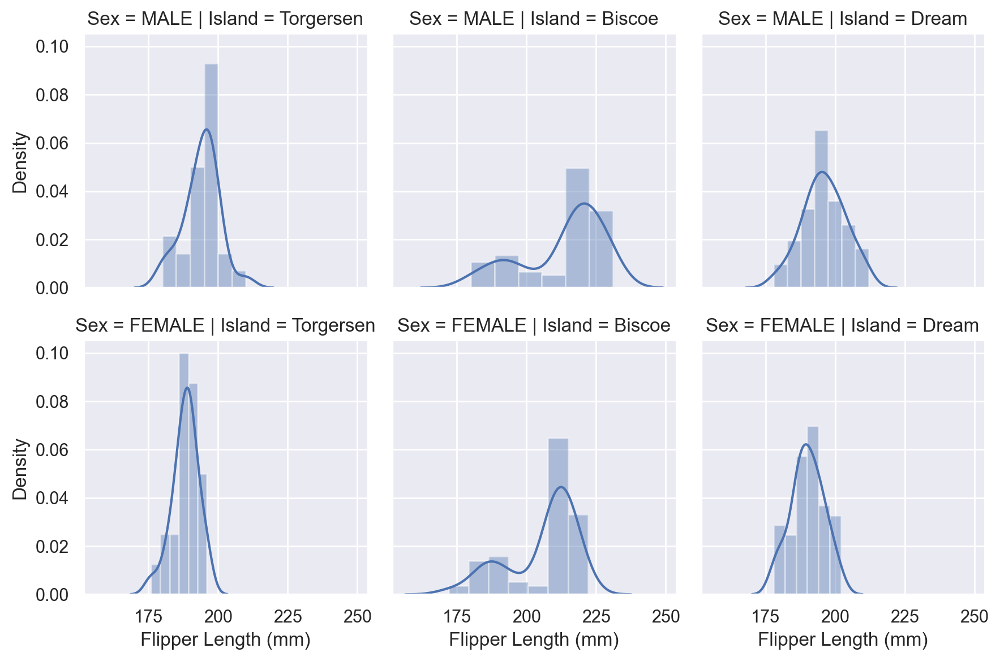

In [159]:
sns.FacetGrid(data=df,row='Sex',col='Island').map(sns.distplot,'Flipper Length (mm)')
plt.show()

# Pair Plot

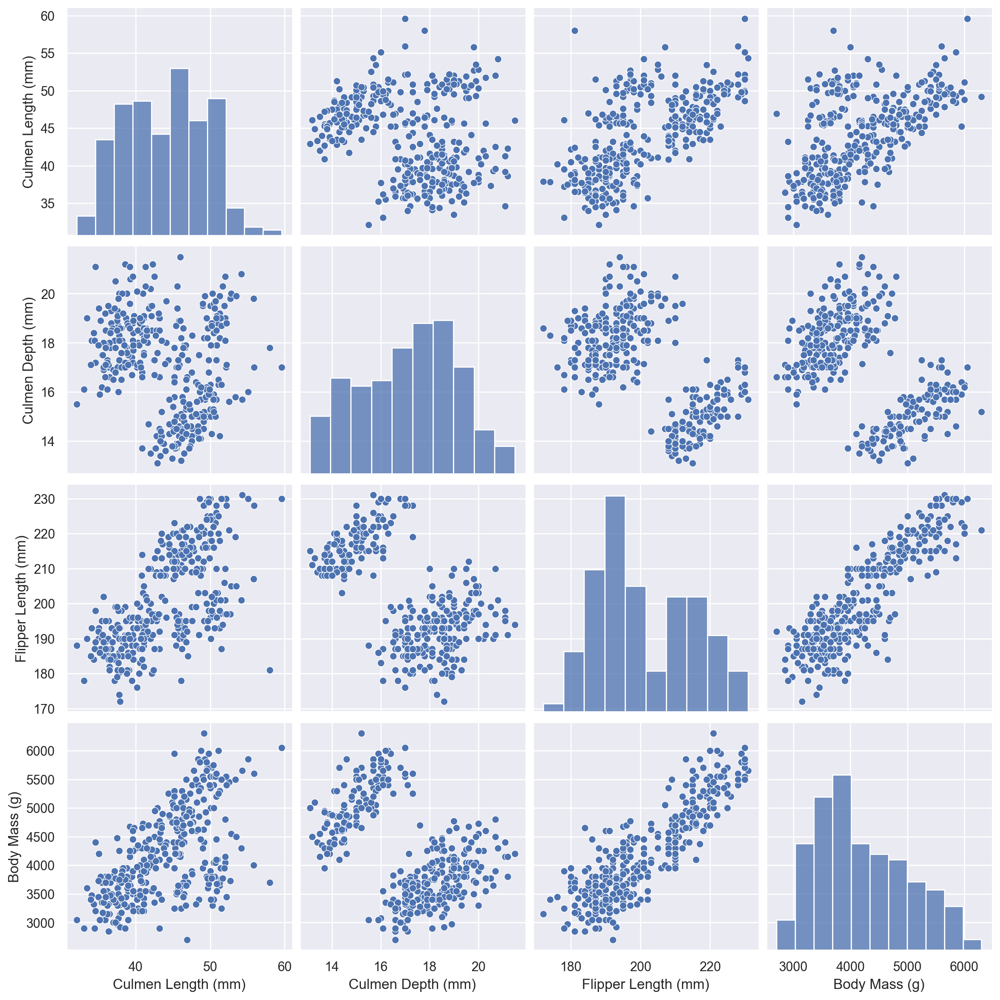

In [162]:
sns.pairplot(data=df,height=3)
plt.show()

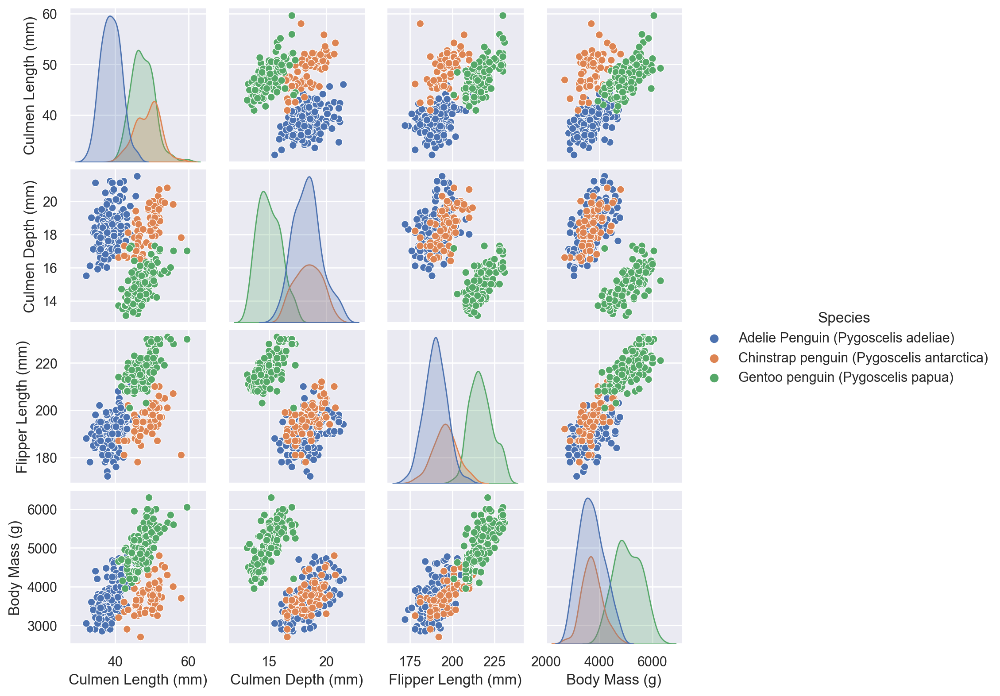

In [167]:
sns.pairplot(data=df,hue='Species',height=2)
plt.show()

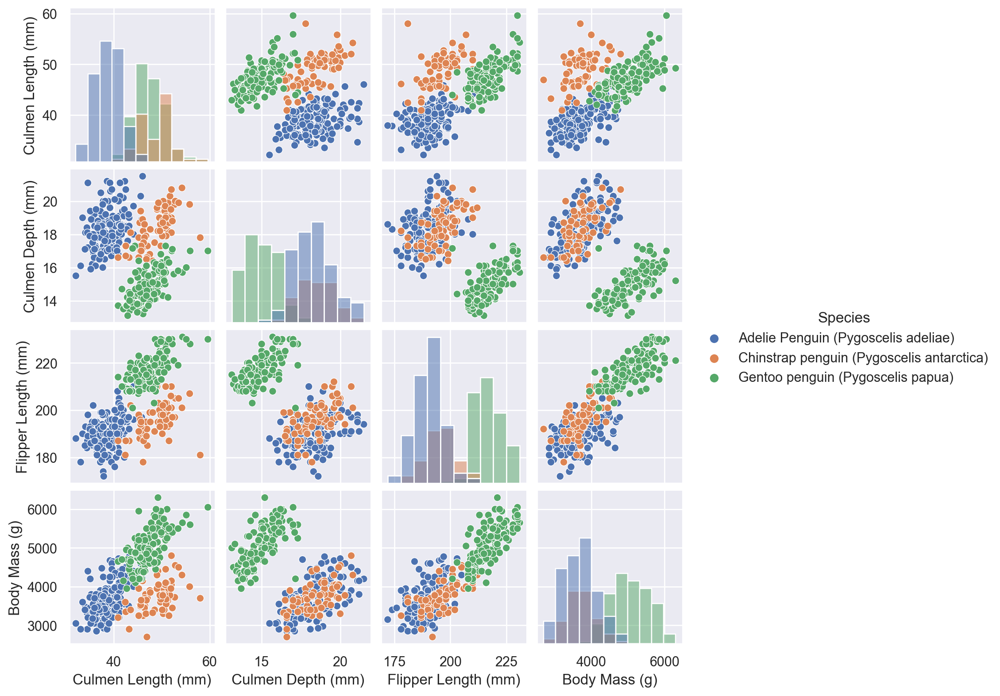

In [170]:
sns.pairplot(data=df,hue='Species',height=2,diag_kind='hist')
plt.show()

# Heat Map

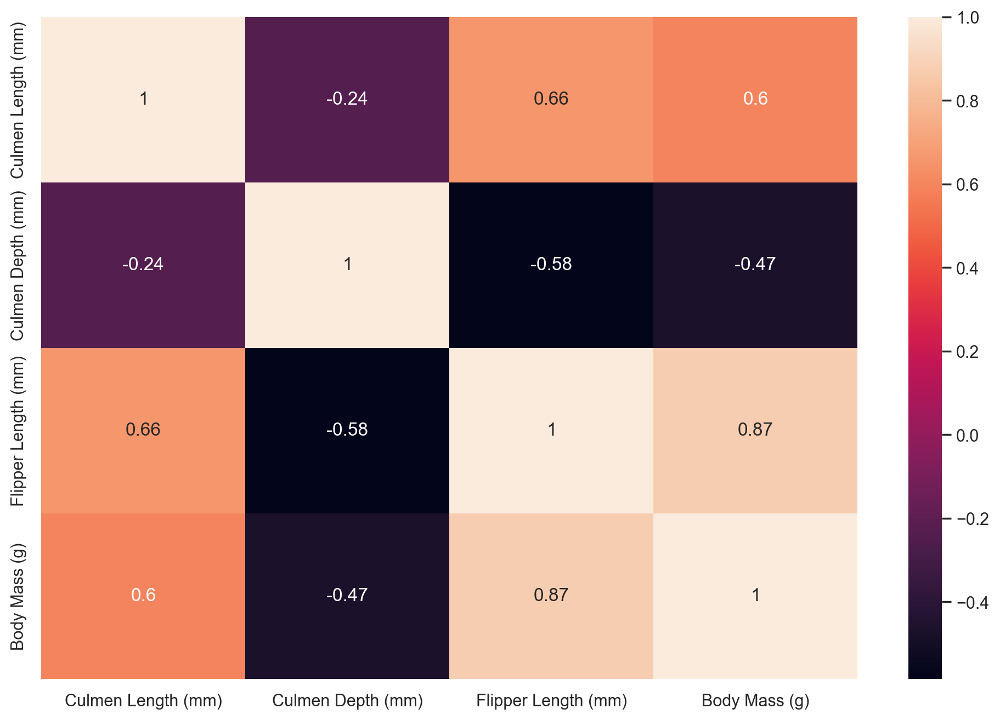

In [174]:
sns.heatmap(df.corr(),annot=True)
plt.show()

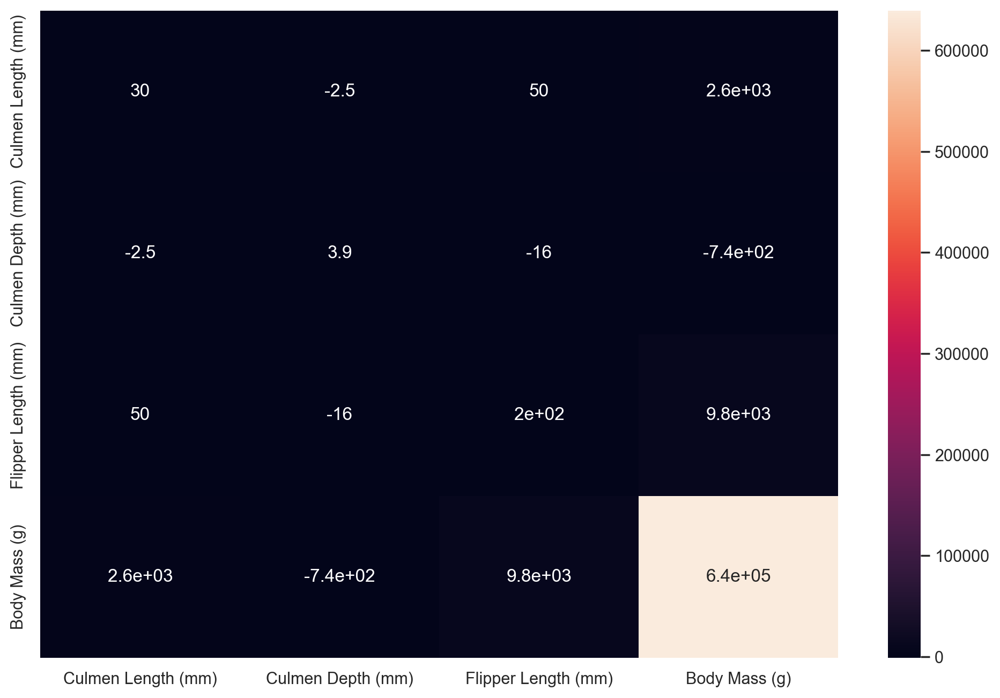

In [175]:
sns.heatmap(df.cov(),annot=True)
plt.show()